In [74]:
%load_ext autoreload
%autoreload 2

In [75]:
import vaemof
from vaemof import experiments
from vaemof import utils
from vaemof.vocabs import SELFIESVocab, MOFVocab, PropVocab
from vaemof import modules
from vaemof import training
from vaemof.model import VAEMOF
from vaemof import configs

from vaemof.utils import header_str
vaemof.experiments.plot_settings()

In [172]:
import os
import random
from tqdm.auto import tqdm
import numpy as np
import torch
import rdkit
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
from sklearn.decomposition import PCA
from itertools import product
from more_itertools import chunked
from collections import OrderedDict
from rdkit.Chem import PandasTools
from IPython.display import SVG, display
from matplotlib import rc
rc('font',**{'family':'sans-serif','sans-serif':['Arial']})
plt.rcParams['font.size'] = 8
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

print(f'rdkit : {rdkit.__version__}')
print(f'torch : {torch.__version__}')
print(f'cuda? {torch.cuda.is_available()}')
tqdm.pandas()
utils.disable_rdkit_log()

rdkit : 2019.09.3
torch : 1.4.0
cuda? True


/home/beangoben/anaconda3/lib/python3.7/site-packages/tqdm/std.py:658: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  from pandas import Panel


## Hparams and model

In [77]:
WORK_DIR = 'results/best/'
hparams_file = os.path.join(WORK_DIR,'config.json')
hparams = configs.AttributeDict.from_jsonfile(hparams_file)
hparams['train_device'] = 'cuda' if torch.cuda.is_available() else 'cpu'
utils.set_seed(hparams['train_seed'])
device = torch.device(hparams['train_device'])
configs.print_config(hparams)
model = VAEMOF.load(hparams)

==================================== config ====================================
== train == :
        train_device:                cuda
          train_seed:                  42
    train_batch_size:                1536
        train_epochs:                  90
            train_lr:0.0005705023000000001
     train_clip_grad:                  20
== vae == :
      vae_latent_dim:                 288
           vae_y_dec:                True
     vae_selfies_dec:                True
         vae_mof_enc:                True
         vae_mof_dec:                True
vae_duplicate_smiles:                True
== mof == :
        mof_encoding:                cats
   mof_weighted_loss:                True
         mof_w_start:                 0.0
           mof_w_end:               0.001
           mof_start:                   0
    mof_const_length:                  10
== y == :
            y_labels:['lcd', 'pld', 'density', 'avf', 'avsa', 'agsa', 'co2n2_co2_mol_kg', 'co2n2_n2_mol_kg', 'co2n

## Load MOF data

Assemble smiles formula: [organic core][metal_node][topology][branch_smiles]

In [78]:
smiles_column = 'branch_smiles'
testtrain_column = 'train/test'
df = experiments.get_generator_df(csv_file=hparams['files_data'],
                                  smiles_column=smiles_column,
                                  use_duplicates=hparams['vae_duplicate_smiles'],
                                  testing=False)
ids2mofs, mof2ids, mof_columns = experiments.get_mofdict(
    df, hparams['mof_encoding'])
df.head()

=================================== Real run ===================================
df shape: (2049964, 8)
df columns: ['branch_smiles', 'id2mof', 'metal_node', 'mof_index', 'organic_core', 'randomized', 'topology', 'train/test']
Found 713 unique mofs


,branch_smiles,id2mof,metal_node,mof_index,organic_core,randomized,topology,train/test
0,CC(c1cc(O)cc(O)c1)(C(Sc1cc(O)cc(O)c1)c1cc(O)cc...,0,sym_7_mc_4,4.0,None,False,acs,1
1,Oc1ccc(-c2cc(/C=C/c3c(-c4ccc(O)cc4)cc([Lr])c(-...,0,sym_7_mc_4,10.0,None,False,acs,1
2,O=S(=O)(O)Cc1nn([Lr])c(CS(=O)(=O)O)c1-c1c(CS(=...,0,sym_7_mc_4,18.0,None,False,acs,1
3,[Lr]c1ccc(-c2c(-c3ccccc3)cc([Lr])c(-c3ccccc3)c...,0,sym_7_mc_4,23.0,None,False,acs,1
4,[Lr]c1ccc(N2C=C(c3ccncc3)N(c3c(-c4ccncc4)cc([L...,0,sym_7_mc_4,29.0,None,False,acs,1


## Load property data

In [79]:
prop_df = experiments.get_prop_df(csv_file=hparams['files_prop'],
                                  targets=hparams['y_labels'],
                                  mof2ids=mof2ids,
                                  testing=False,
                                  smiles_column=smiles_column,
                                  compute_scscore=True)
prop_df.head()

=================================== Real run ===================================
Restored variables from data/scscore_1024uint8_model.ckpt-10654.as_numpy.json.gz



Removed 2923 datapoints due to mask.
Removed 1819 datapoints due non-valid mof (mof2ids).
Removed 245 datapoints due to high selectivity.


,organic_core,metal_node,topology,branch_smiles,lcd,pld,density,avf,avsa,agsa,...,co2ch4_selectivity,co2ch4_heat_avg,co2ch4_heat_co2,co2ch4_heat_ch4,co2ch4_heat_molfrac,selfies_safe,mask,train/test,scscore,id2mof
0,None,sym_7_mc_4,acs,COc1c(/C=C/c2ccc([Lr])cc2)cc(OC)c(/C=C/c3ccc([...,24.87798,19.29733,0.164554,0.75459,1159.130,7044.060,...,1.786937,-8.58733,-12.08169,-7.92879,-8.61737,True,True,1,3.384814,0
1,None,sym_7_mc_4,acs,CSC1=C2CCC(=C(C(=C2SC)[Lr])SC)C(=C1[Lr])SC,7.78281,5.18969,1.119280,0.07631,978.891,874.575,...,3.197185,-20.54264,-24.18495,-18.74239,-20.17205,True,True,0,3.176298,0
2,None,sym_7_mc_4,acs,O=C(c1cc(O)c(cc1O)[Lr])OOC(=O)c1cc(O)c(cc1O)[Lr],17.01677,15.91720,0.320703,0.61736,1628.620,5078.290,...,3.004385,-11.22187,-16.39748,-9.43473,-11.17660,True,True,1,2.668208,0
3,None,sym_7_mc_4,acs,Oc1c(cc(c(c1O)[Lr])O)c1nnc(nn1)c1ccc(c(c1)O)[Lr],19.50569,17.17410,0.291374,0.66206,1401.740,4810.800,...,2.250807,-9.49245,-13.39225,-8.37161,-9.37550,True,True,1,3.688210,0
4,None,sym_7_mc_4,acs,[Lr]C12C=CC(C=C1)(C=C2)[Lr],9.58653,8.21739,0.799733,0.24196,2020.860,2526.910,...,2.167731,-15.36924,-18.34929,-14.67475,-15.38911,True,True,1,1.831772,0


## Train/test splits and hparams

In [80]:
train_index = np.array(df[df[testtrain_column] == 1].index.tolist())
test_index = np.array(df[df[testtrain_column] == 0].index.tolist())
prop_train_index = np.array(
    prop_df[prop_df[testtrain_column] == 1].index.tolist())
prop_test_index = np.array(
    prop_df[prop_df[testtrain_column] == 0].index.tolist())
print(f'Test  sizes: {len(test_index):7d} and {len(prop_test_index):7d}')

Test  sizes:  154997 and    4107


## Prepare tain/test

In [81]:
train_mof = model.df_to_tuples(df.loc[train_index], smiles_column)
test_mof = model.df_to_tuples(df.loc[test_index], smiles_column)
prop_train = model.df_to_tuples(prop_df.loc[prop_train_index], smiles_column)
prop_test = model.df_to_tuples(prop_df.loc[prop_test_index], smiles_column)
train_data = train_mof + prop_train
test_data = test_mof + prop_test

## Training stats

In [82]:
log_df = pd.read_csv(configs.at_results_dir(hparams,'files_log'))
print(log_df.shape)
print(log_df.columns)
log_df.head()

(90, 69)
Index(['epoch', 'test_kl', 'test_x', 'test_mof', 'test_y', 'test_loss',
       'lcd-r2', 'lcd-MAE', 'pld-r2', 'pld-MAE', 'density-r2', 'density-MAE',
       'avf-r2', 'avf-MAE', 'avsa-r2', 'avsa-MAE', 'agsa-r2', 'agsa-MAE',
       'co2n2_co2_mol_kg-r2', 'co2n2_co2_mol_kg-MAE', 'co2n2_n2_mol_kg-r2',
       'co2n2_n2_mol_kg-MAE', 'co2n2_selectivity-r2', 'co2n2_selectivity-MAE',
       'co2n2_heat_avg-r2', 'co2n2_heat_avg-MAE', 'co2n2_heat_co2-r2',
       'co2n2_heat_co2-MAE', 'co2n2_heat_n2-r2', 'co2n2_heat_n2-MAE',
       'co2n2_heat_molfrac-r2', 'co2n2_heat_molfrac-MAE',
       'co2ch4_co2_mol_kg-r2', 'co2ch4_co2_mol_kg-MAE', 'co2ch4_ch4_mol_kg-r2',
       'co2ch4_ch4_mol_kg-MAE', 'co2ch4_selectivity-r2',
       'co2ch4_selectivity-MAE', 'co2ch4_heat_avg-r2', 'co2ch4_heat_avg-MAE',
       'co2ch4_heat_co2-r2', 'co2ch4_heat_co2-MAE', 'co2ch4_heat_ch4-r2',
       'co2ch4_heat_ch4-MAE', 'co2ch4_heat_molfrac-r2',
       'co2ch4_heat_molfrac-MAE', 'scscore-r2', 'scscore-MAE', 'lr',

,epoch,test_kl,test_x,test_mof,test_y,test_loss,lcd-r2,lcd-MAE,pld-r2,pld-MAE,...,mof_acc,mean_r2,train_kl_ratio,train_x_ratio,train_mof_ratio,train_y_ratio,test_kl_ratio,test_x_ratio,test_mof_ratio,test_y_ratio
0,0,912.648813,0.451462,10.529093,1.843436,0.460589,0.906155,112.079674,0.975873,49.082306,...,3.748911,0.509237,0.008547,0.991453,0.000000,0.000000,0.019815,0.980185,0.000000,0.000000
1,1,276.613159,0.217422,6.070345,0.461664,0.272185,0.986669,46.877434,0.996405,14.961312,...,34.652596,0.779580,0.153861,0.807656,0.000205,0.038278,0.198797,0.798804,0.000279,0.002120
2,2,155.777572,0.119784,6.311328,0.451238,0.180457,0.987146,45.208916,0.925927,60.363281,...,30.429363,0.791782,0.248288,0.654185,0.000586,0.096941,0.329092,0.663783,0.000874,0.006251
3,3,110.457376,0.082680,6.734319,0.429072,0.147153,0.990065,39.073349,0.982350,33.022678,...,25.923086,0.786539,0.326533,0.491545,0.001179,0.180743,0.425489,0.561861,0.001716,0.010934
4,4,92.115217,0.059337,7.265631,0.422235,0.131124,0.993012,33.789803,0.997410,15.315241,...,21.429799,0.848538,0.376332,0.363076,0.001834,0.258758,0.528604,0.452524,0.002771,0.016101


,epoch,test_kl,test_x,test_mof,test_y,test_loss,lcd-r2,lcd-MAE,pld-r2,pld-MAE,...,mof_acc,mean_r2,train_kl_ratio,train_x_ratio,train_mof_ratio,train_y_ratio,test_kl_ratio,test_x_ratio,test_mof_ratio,test_y_ratio
0,0,912.648813,0.451462,10.529093,1.843436,0.460589,0.906155,112.079674,0.975873,49.082306,...,3.748911,0.509237,0.008547,0.991453,0.000000,0.000000,0.019815,0.980185,0.000000,0.00000
1,1,276.613159,0.217422,6.070345,0.461664,0.272185,0.986669,46.877434,0.996405,14.961312,...,34.652596,0.779580,0.153861,0.807656,0.000205,0.038278,0.198797,0.798804,0.000279,0.00212


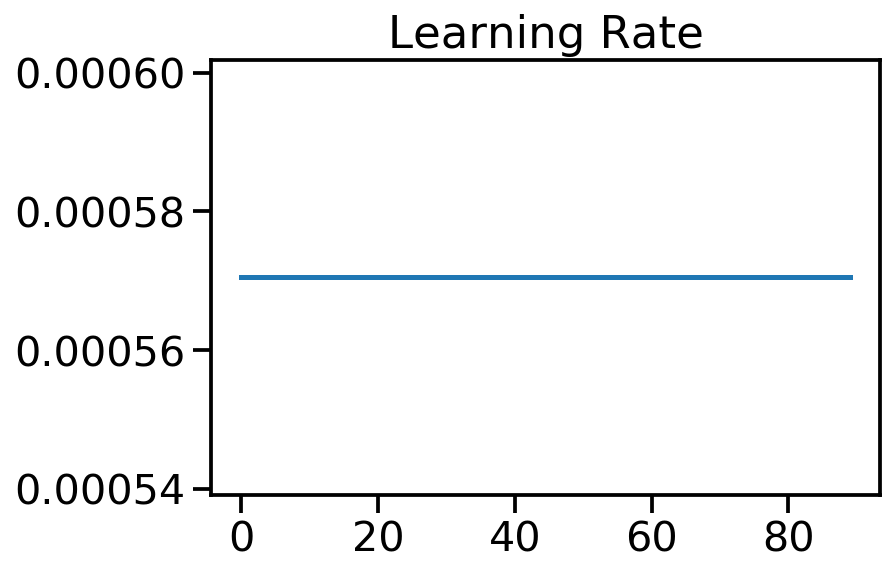

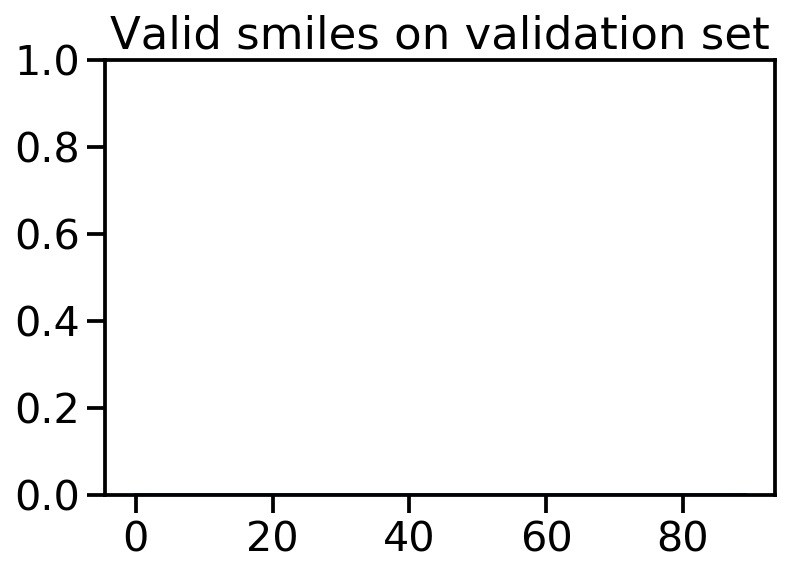

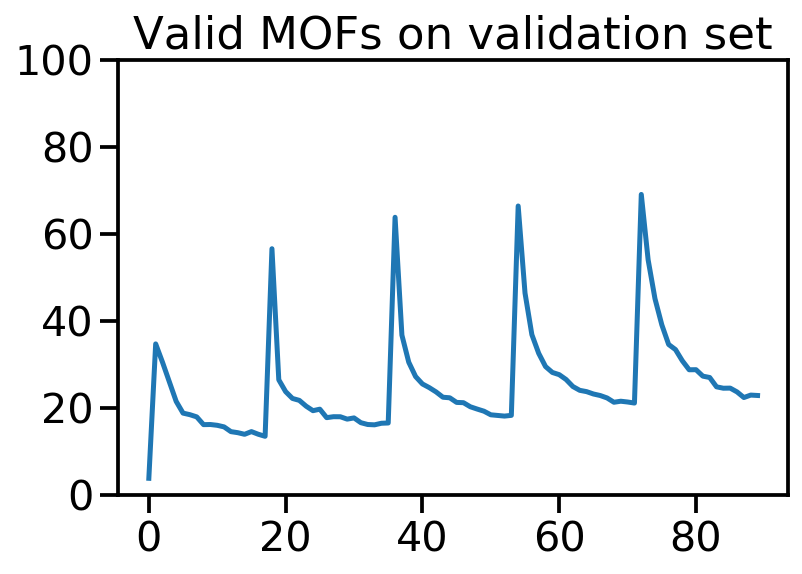

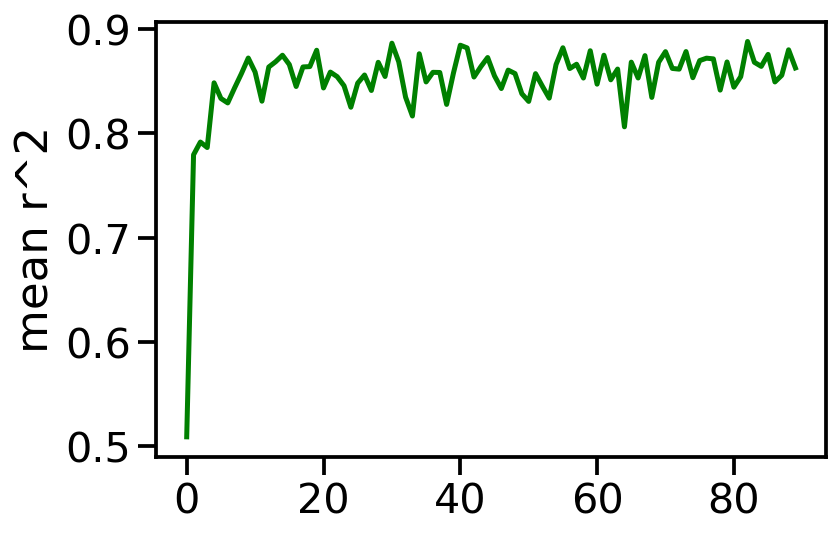

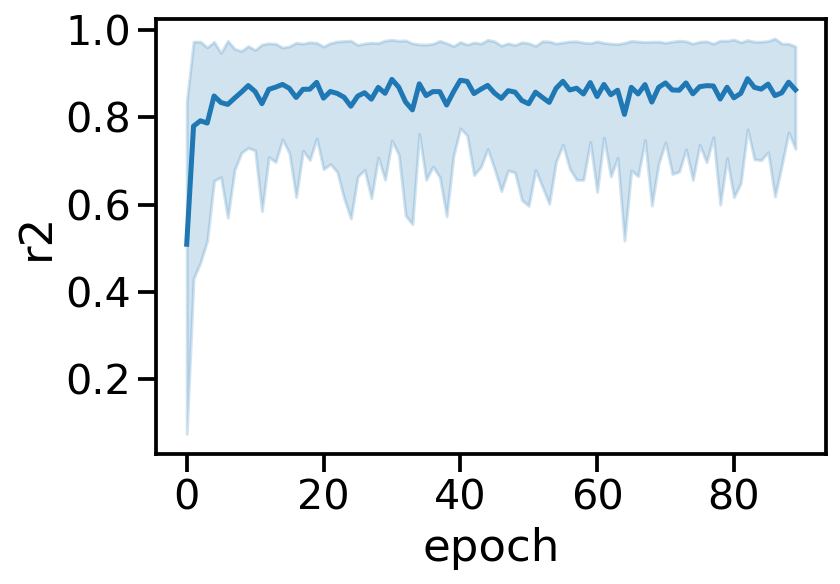

...

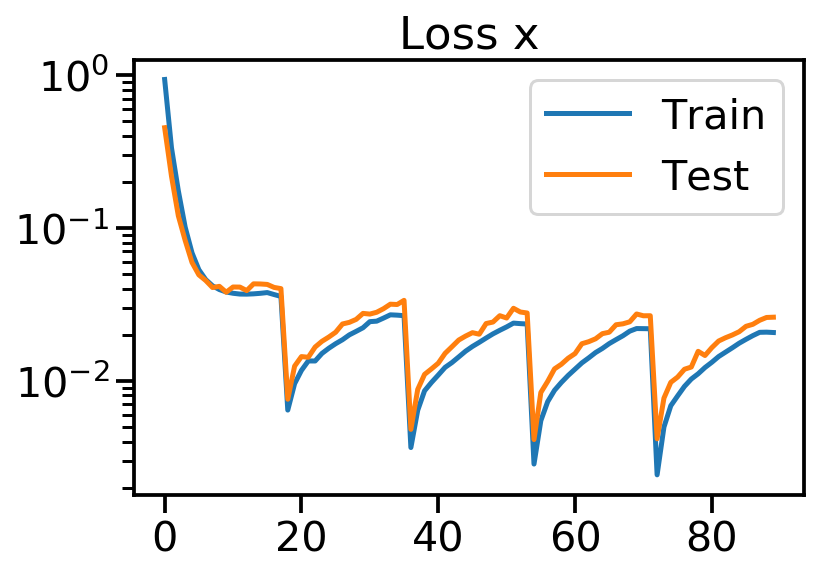

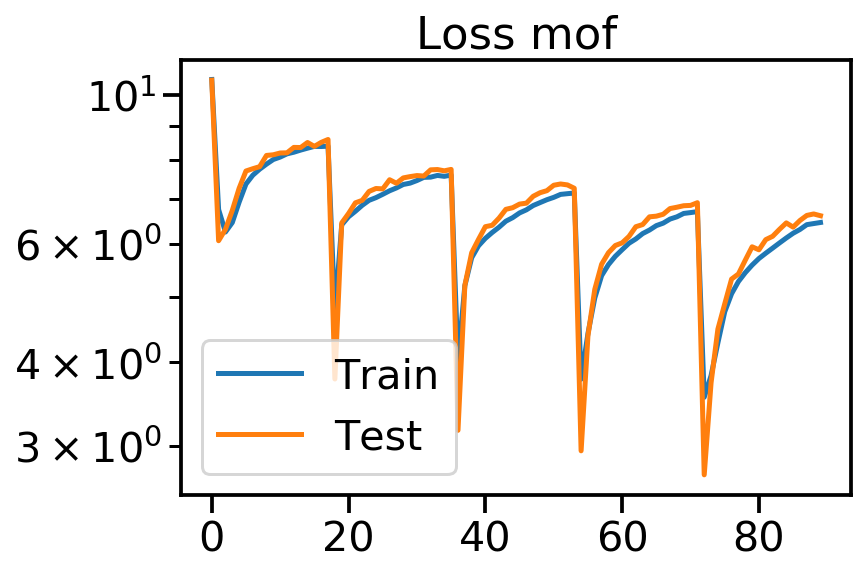

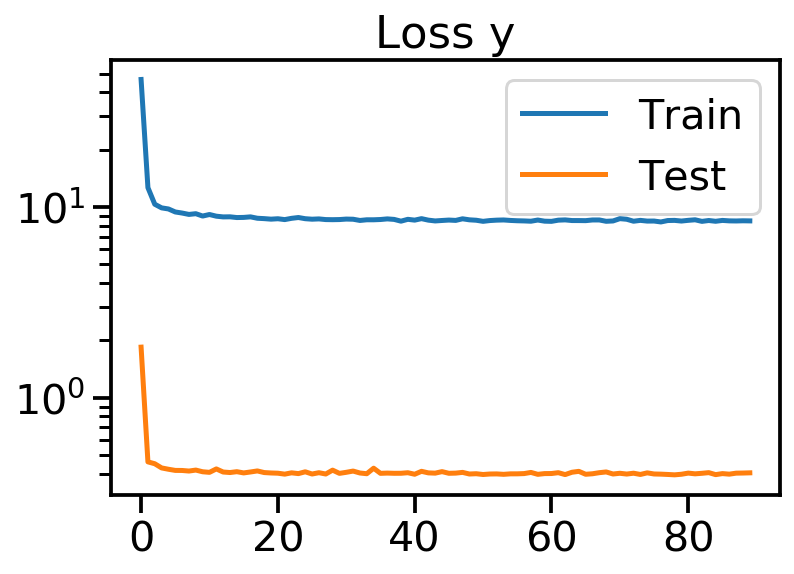

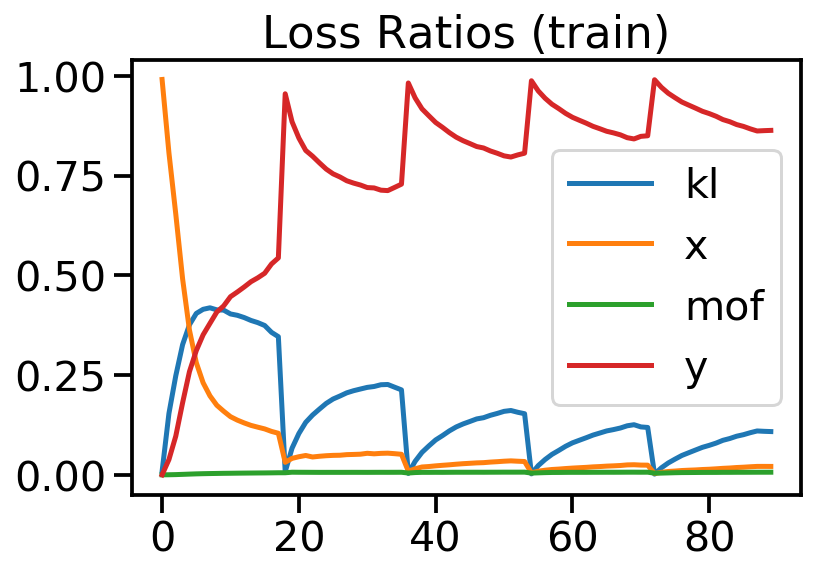

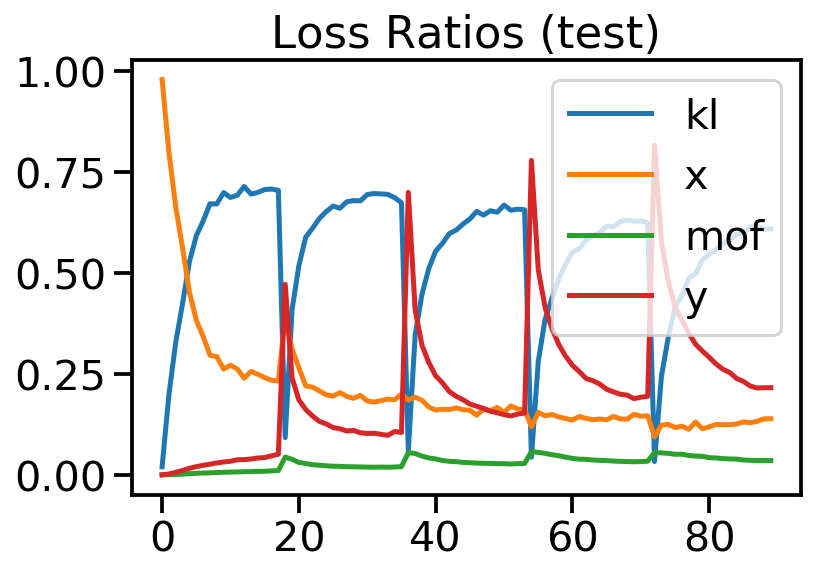

In [83]:
COMPONENTS = training.COMPONENTS
epochs = log_df['epoch'].values

display(log_df.head(2))
plt.plot(epochs, log_df['lr'])
plt.title('Learning Rate')
plt.show()

plt.plot(epochs, log_df['valid_smiles'])
plt.title('Valid smiles on validation set')
plt.ylim([0,1])
plt.show()

plt.plot(epochs, log_df['mof_acc'])
plt.title('Valid MOFs on validation set')
plt.ylim([0,100])
plt.show()

plt.plot(epochs, log_df['mean_r2'],c='g',label='valid')
plt.ylabel('mean r^2')
plt.show()

results=[]
for label in hparams['y_labels']:
    metric = f'{label}-r2'
    results.extend([{'epoch':epoch,'r2':value,"prop":label} for epoch, value in log_df[['epoch',metric]].values ]  )
prop_df = pd.DataFrame(results)
sns.lineplot(x='epoch',y='r2', data=prop_df)
plt.show()

for label in COMPONENTS:
    plt.plot(epochs, log_df[f'λ_{label}'], label =label)
plt.legend()
plt.show()

for label in COMPONENTS:
    plt.plot(epochs, log_df[f'train_{label}'], label='Train')
    plt.plot(epochs, log_df[f'test_{label}'], label='Test')
    plt.title(f'Loss {label}')
    plt.yscale("log")
    plt.legend()
    plt.show()

for prefix in ['train','test']:
    for label in COMPONENTS:
        plt.plot(epochs, log_df[f'{prefix}_{label}_ratio'], label=label) 
    plt.title(f'Loss Ratios ({prefix})')
    plt.legend()
    plt.show()

## Properties

In [84]:
print(header_str('R^2 scores and MAEs'))
src_data = prop_test
batch_size = 256
n_loops = int(np.ceil(len(src_data) / batch_size))
y_pred, y_true = [], []
for chunk in  tqdm(chunked(src_data,batch_size),total=n_loops, desc='Pred'):
    batch = model.tuples_to_tensors(chunk)
    z = model.inputs_to_z(batch['x'],batch['mof'])
    outs = model.z_to_outputs(z)
    y_true.extend(model.vocab_y.inverse_transform(batch['y']))
    y_pred.extend(outs['y'])
    
y_pred = np.stack(y_pred)
y_true = np.stack(y_true)
experiments.regression_statistics(y_true, y_pred, hparams['y_labels'])

============================= R^2 scores and MAEs ==============================



lcd , R2:  0.8969805284095096 , MAE:  2.8415043 , RMSE:  4.2975836
pld , R2:  0.8875130292739435 , MAE:  2.646061 , RMSE:  4.090592
density , R2:  0.8138829996370677 , MAE:  0.079742566 , RMSE:  0.11824346
avf , R2:  0.8805978180063787 , MAE:  0.0495678 , RMSE:  0.07497243
avsa , R2:  0.5765631019768549 , MAE:  202.08176 , RMSE:  345.684
agsa , R2:  0.8772665877093206 , MAE:  394.4032 , RMSE:  613.68335
co2n2_co2_mol_kg , R2:  0.20168284708364814 , MAE:  0.09361341 , RMSE:  0.2187651
co2n2_n2_mol_kg , R2:  0.8244530320875515 , MAE:  0.04156124 , RMSE:  0.06542657
co2n2_selectivity , R2:  0.2987803416212301 , MAE:  2.0505805 , RMSE:  4.817375
co2n2_heat_avg , R2:  0.5158739228456022 , MAE:  1.9797317 , RMSE:  3.5018268
co2n2_heat_co2 , R2:  0.4963856751493009 , MAE:  2.1840148 , RMSE:  3.8265216
co2n2_heat_n2 , R2:  0.48099763680352403 , MAE:  1.0021987 , RMSE:  1.9731987
co2n2_heat_molfrac , R2:  0.5151375153889746 , MAE:  2.0412552 , RMSE:  3.5670214
co2ch4_co2_mol_kg , R2:  0.246016

,label,R2,MAE,RMSE
0,lcd,0.896981,2.841504,4.297584
1,pld,0.887513,2.646061,4.090592
2,density,0.813883,0.079743,0.118243
3,avf,0.880598,0.049568,0.074972
4,avsa,0.576563,202.081757,345.683990
5,agsa,0.877267,394.403198,613.683350
6,co2n2_co2_mol_kg,0.201683,0.093613,0.218765
7,co2n2_n2_mol_kg,0.824453,0.041561,0.065427
8,co2n2_selectivity,0.298780,2.050581,4.817375
9,co2n2_heat_avg,0.515874,1.979732,3.501827


## Prior check

In [85]:
print(header_str('prior'))
n = 10000
gen_df = experiments.sample_model(model, n)
print('valid smiles: {} out of {} ({}%)'.format(gen_df['valid'].sum(),n,gen_df['valid'].sum()/n*100.0))
gen_df.head(2)

==================================== prior =====================================



valid smiles: 6103 out of 10000 (61.029999999999994%)


,branch_smiles,valid,metal_node,organic_core,topology,lcd,pld,density,avf,avsa,...,co2n2_heat_n2,co2n2_heat_molfrac,co2ch4_co2_mol_kg,co2ch4_ch4_mol_kg,co2ch4_selectivity,co2ch4_heat_avg,co2ch4_heat_co2,co2ch4_heat_ch4,co2ch4_heat_molfrac,scscore
0,O=CC1C2C=CC([Lr])=CC([Lr])C12,True,sym_8_mc_7,sym_5_vae_298,tpt,2.204674,7.142600,0.742138,0.384768,1452.874756,...,-10.576055,-13.873171,1.064238,3.791821,3.090080,-15.566813,-17.896265,-14.188129,-15.317948,1.725331
1,O1cccc(SCS1(O)(C(O)(O)C[Lr]C))#N,False,sym_9_mc_5,sym_5_vae_304,soc,27.129337,27.747866,0.535436,0.693673,946.271179,...,-6.945181,-11.907741,0.791864,1.848713,3.199269,-11.103594,-17.176071,-8.969567,-11.251987,4.055328


## Sampling the neighboring space of known MOF

In [206]:
nu_1104 = [('sym_5_on_12','sym_12_mc_11','ftw','[Lr]c1ccc(C#Cc2ccc([Lr])cc2)cc1',0.0)]
nu_df = pd.DataFrame(nu_1104,columns=['organic_core','metal_node','topology','branch_smiles','dist'])
nu_tuple = model.df_to_tuples(nu_df, smiles_column)
nu_tensor = model.tuples_to_tensors(nu_tuple)
nu_z = model.inputs_to_z(nu_tensor['x'],nu_tensor['mof'])

In [207]:
i = 0
tries = 100
noise_max = 20
while i < tries:
    sample = []
    noise = random.uniform(0,noise_max)
    sample_z = experiments.perturb_z(nu_z, noise)
    try:
        outs = model.z_to_outputs(sample_z)
        smiles = outs['x'][0]
        if vaemof.vocabs.valid_smiles(smiles):
            sample_df = pd.DataFrame(nu_1104,columns=['organic_core','metal_node','topology','branch_smiles','dist'])
            dist = np.linalg.norm(nu_z-sample_z)
            sample_df['organic_core'] = outs['mof'][0][1]
            sample_df['metal_node'] = outs['mof'][0][0]
            sample_df['topology'] = outs['mof'][0][2]
            sample_df['branch_smiles'] = outs['x'][0]
            sample_df['dist'] = dist
            nu_df = nu_df.append(sample_df, ignore_index=True)
            nu_df.shape
            i = i + 1
    except:
        pass
nu_df = nu_df.sort_values(by=['dist'])
nu_df.shape

(101, 5)

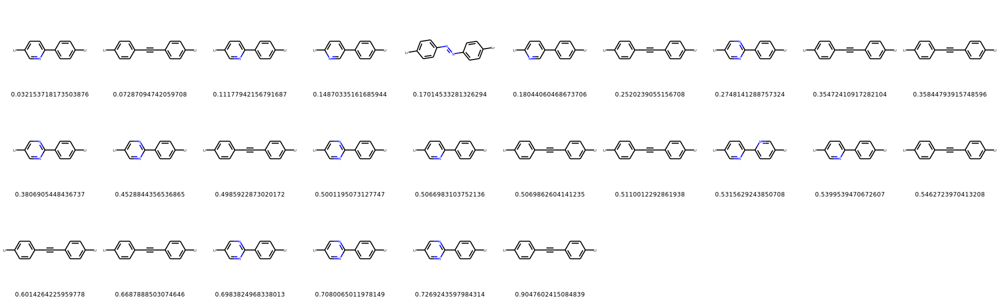

In [208]:
nu_df['mol'] = nu_df['branch_smiles'].apply(lambda x: rdkit.Chem.MolFromSmiles(x))
display(PandasTools.FrameToGridImage(nu_df[(nu_df['dist'] > 0.0) & (nu_df['dist'] < 1.0)].sort_values(by=['dist']),column='mol', legendsCol='dist',molsPerRow=10))

## Interpolating between known MOF structures

In [221]:
nu_1104 = [('sym_5_on_12','sym_12_mc_11','ftw','[Lr]c1ccc(C#Cc2ccc([Lr])cc2)cc1',0.0)]
nu_1000 = [('sym_5_on_11','sym_8_mc_9','csq','[Lr]c1ccc([Lr])cc1',0.0)]
nu_df_1104 = pd.DataFrame(nu_1104,columns=['organic_core','metal_node','topology','branch_smiles','dist'])
nu_df_1000 = pd.DataFrame(nu_1000,columns=['organic_core','metal_node','topology','branch_smiles','dist'])
nu_tuple_1104 = model.df_to_tuples(nu_df_1104, smiles_column)
nu_tensor_1104 = model.tuples_to_tensors(nu_tuple_1104)
nu_z_1104 = model.inputs_to_z(nu_tensor_1104['x'],nu_tensor_1104['mof'])
nu_tuple_1000 = model.df_to_tuples(nu_df_1000, smiles_column)
nu_tensor_1000 = model.tuples_to_tensors(nu_tuple_1000)
nu_z_1000 = model.inputs_to_z(nu_tensor_1000['x'],nu_tensor_1000['mof'])
full_dist = np.linalg.norm(nu_z_1104-nu_z_1000)
nu_df_1000['dist'] = full_dist

In [222]:
interpolate_num = 5
nu_z = [(nu_z_1000-nu_z_1104)/interpolate_num*i+nu_z_1104 for i in range(1,interpolate_num)]
tries = 5
for z in nu_z:
    i = 0
    while i < tries:
        try:
            outs = model.z_to_outputs(z)
            smiles = outs['x']
            if vaemof.vocabs.valid_smiles(smiles[0]):
                interpolate_df = pd.DataFrame(nu_1104,columns=['organic_core','metal_node','topology','branch_smiles','dist'])
                dist = np.linalg.norm(nu_z_1104-z)
                interpolate_df['organic_core'] = outs['mof'][0][1]
                interpolate_df['metal_node'] = outs['mof'][0][0]
                interpolate_df['topology'] = outs['mof'][0][2]
                interpolate_df['branch_smiles'] = outs['x'][0]
                interpolate_df['dist'] = dist
                nu_df_1104 = nu_df_1104.append(interpolate_df, ignore_index=True)
                i = i + 1
        except:
            pass
full_df = nu_df_1104.append(nu_df_1000, ignore_index=True)
full_df.shape

(22, 5)

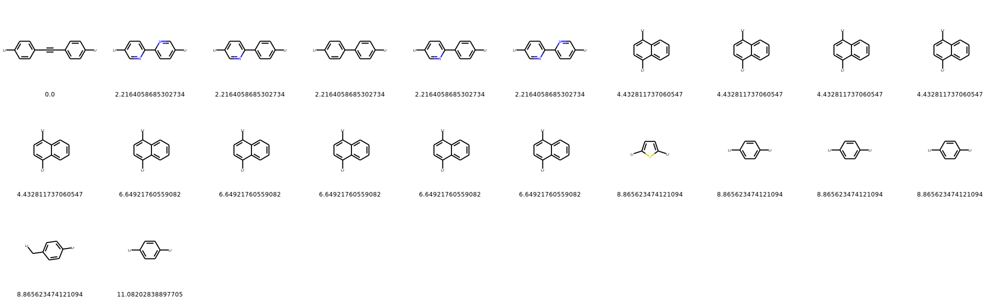

In [223]:
full_df['mol'] = full_df['branch_smiles'].apply(lambda x: rdkit.Chem.MolFromSmiles(x))
display(PandasTools.FrameToGridImage(full_df.sort_values(by=['dist']),column='mol', legendsCol='dist',molsPerRow=10))

## Posterior check

In [225]:
print(header_str('Posterior check'))

tries=10
sub_sample =1000
src_data = train_data
src_data = random.sample(src_data,min(len(src_data),sub_sample))
valid_smiles=[]
recon_smiles=[]
n = len(src_data)
results=[]
mof_results=[]
for t in tqdm(src_data):
    batch = [t]*tries
    batch = model.tuples_to_tensors(batch)
    z = model.inputs_to_z(batch['x'],batch['mof'])
    outs = model.z_to_outputs(z)
    true_smiles = vaemof.vocabs.isosmiles(model.vocab.ids_to_string(t[0]))
    true_mof = model.vocab_mof.ids_to_mof(t[1])
    smiles_list = outs['x']
    mof_list = outs['mof']
    acc_mof = any([ all(i==true_mof) for i in np.array(mof_list)])
    valid_smiles = [si for si in set(smiles_list) if vaemof.vocabs.valid_smiles(si)]
    valid_smiles = [vaemof.vocabs.isosmiles(si) for si in valid_smiles]
    same_smiles = [si for si in valid_smiles if si==true_smiles]
    results.append([true_smiles, smiles_list[0], len(same_smiles)>0,len(valid_smiles)>0])
    mof_results.append(acc_mof)
        
post_df = pd.DataFrame(results,columns=['smiles','recon_smiles','same','valid'])
print('valid: {} out of {} ({:.2f}%)'.format(post_df['valid'].sum(),n,post_df['valid'].sum()/n*100.0))
print('same : {} out of {} ({:.2f}%)'.format(post_df['same'].sum(),n,post_df['same'].sum()/n*100.0))
display(post_df.head())
print('MOF recon acc: {}'.format(float(sum(mof_results))/float(len(mof_results))))

=============================== Posterior check ================================



valid: 997 out of 1000 (99.70%)
same : 984 out of 1000 (98.40%)


,smiles,recon_smiles,same,valid
0,O=S(=O)(O)C1=C([Lr])C2=CC([Lr])OOC2=C1S(=O)(=O)O,O=S(=O)(O)C1=C([Lr])C2=CC([Lr])OOC2=C1S(=O)(=O)O,True,True
1,CCCC(O[Lr])C(/C=C/[Lr])(CCC)CCC,CCCC(O[Lr])C(/C=C/[Lr])(CCC)CCC,True,True
2,OC1=Cc2c(ccc([Lr])c2O)SC(O)=C1[Lr],Oc1cc2c(OS)c([Lr])ccc2c(O)c1[Lr],True,True
3,C#Cc1cc(-c2nnc(-c3cccc([Lr])c3C#C)nc2C#C)c(C#C...,C#Cc1cc(-c2nnc(-c3cccc([Lr])c3C#C)nc2C#C)c(C#C...,True,True
4,NC(=O)c1cc(-c2cnc(-c3cc(C(N)=O)c([Lr])c(C(N)=O...,NC(=O)c1cc(-c2cnc(-c3cc(C(N)=O)c([Lr])c(C(N)=O...,True,True


MOF recon acc: 0.111


In [226]:
sub_sample = 100000
src_data = train_data
src_data = random.sample(src_data,min(len(src_data),sub_sample))
n = len(src_data)
batch_size=64
n_loops = int(np.ceil(n/batch_size))
z=[]
mof=[]
for chunk in tqdm(chunked(src_data,batch_size),total=n_loops, desc='Generating predictions'):
    mof.extend([model.vocab_mof.ids_to_mof(t[1]) for t in chunk])
    batch = model.tuples_to_tensors(chunk)
    z_tensor = model.inputs_to_z(batch['x'],batch['mof'])
    z.extend(z_tensor.cpu().numpy())
        
z = np.stack(z)
z_pca = PCA(2).fit_transform(z)
z_mof_df = pd.DataFrame(mof,columns=mof_columns)
z_mof_df['x']=z_pca[:,0]
z_mof_df['y']=z_pca[:,1]
print(z.shape)
z_mof_df.head()


(100000, 288)


,metal_node,organic_core,topology,x,y
0,sym_8_mc_8,sym_3_vae_403,the,-0.085798,0.632897
1,sym_8_mc_9,sym_3_vae_337,the,1.000912,0.136862
2,sym_8_mc_7,sym_3_vae_192,the,-2.490875,-0.311148
3,sym_5_mc_2,sym_3_vae_BR429,pto,-1.672236,-0.429290
4,sym_4_mc_1,sym_4_vae_645,lcsb,-0.789690,-0.404130


(100000, 288)


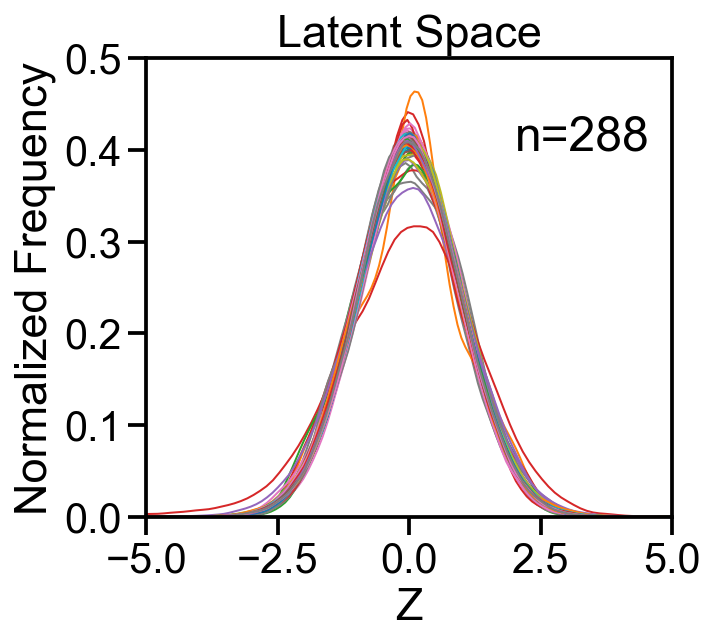

In [227]:
from sklearn.neighbors import KernelDensity
rc('font',**{'family':'sans-serif','sans-serif':['Arial']})
plt.rcParams['font.size'] = 8
print(z.shape)
plt.figure(figsize=(5,4.5))
for i in range(len(z[0])):
    sns.kdeplot(z[:,i], lw=1)
plt.ylabel('Normalized Frequency')
plt.xlabel('Z')
plt.title('Latent Space')
plt.text(2,0.4,'n=%s'%(len(z[0])),fontsize=24)
plt.ylim(0,0.5)
plt.xlim(-5,5)
plt.tight_layout()
plt.savefig('images/kde.png',dpi=300,transparent=True)
plt.show()

================================== metal_node ==================================


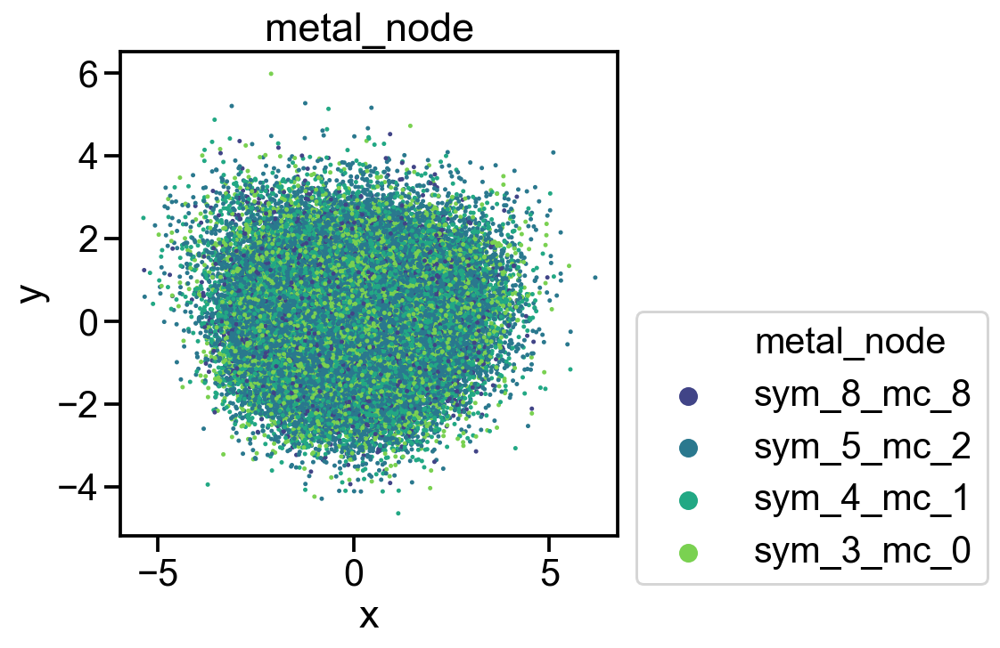

=================================== topology ===================================


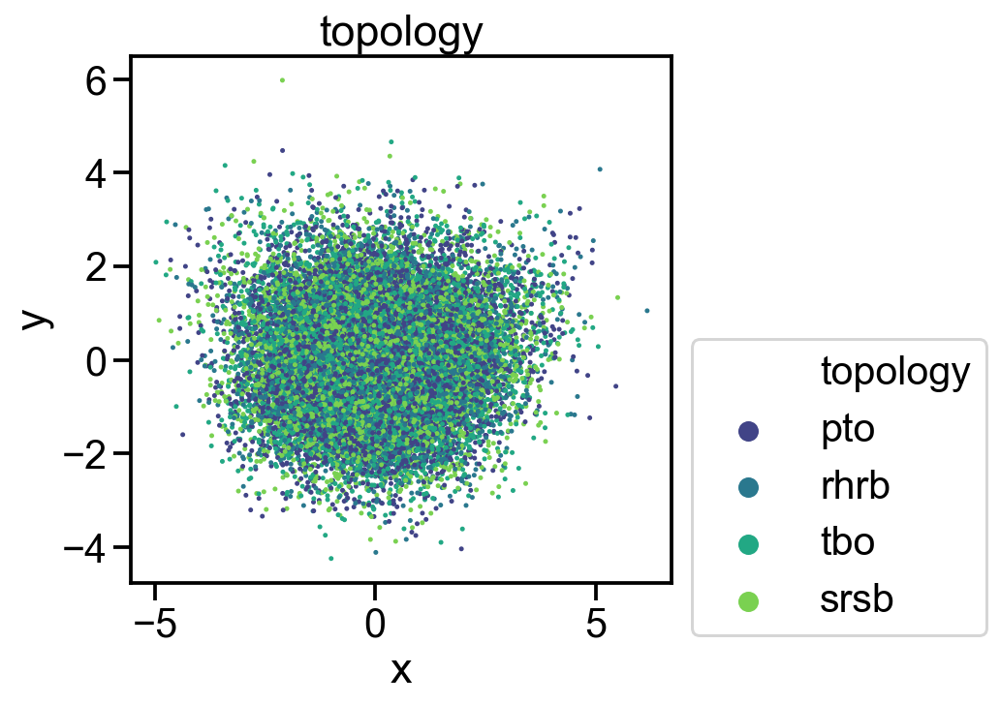

================================= organic_core =================================


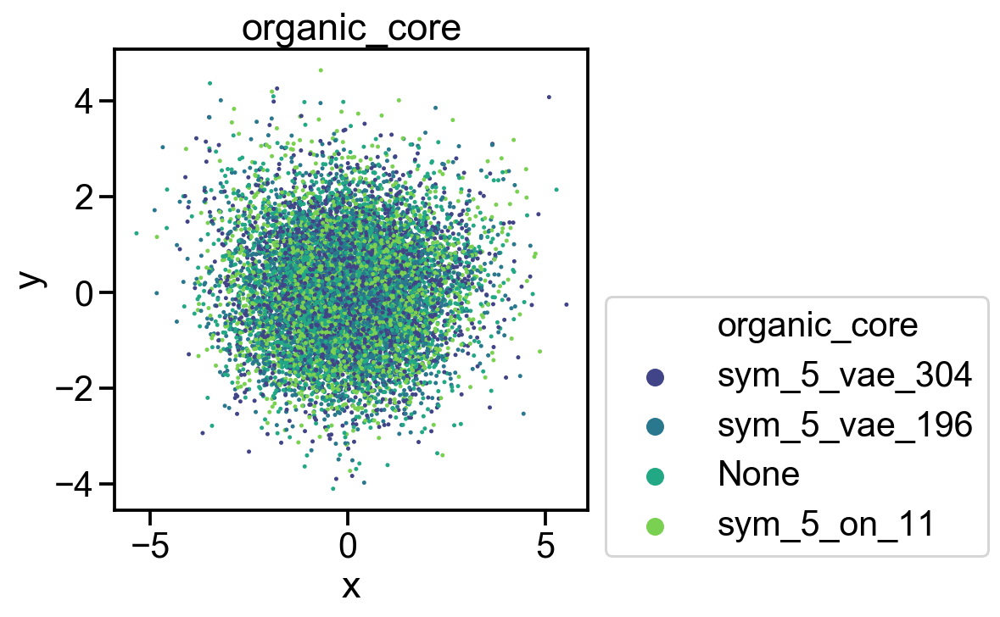

In [228]:
top_k=4
tries = 0
for index,col in enumerate(['metal_node','topology','organic_core']):
    print(header_str(col))
    plt.figure(figsize=(5,5))
    top_cat = z_mof_df[col].value_counts(sort=True,ascending=False).iloc[:top_k].index.tolist()
    sns.scatterplot(x='x',y='y',hue=col,s=3,palette='viridis',data=z_mof_df[z_mof_df[col].isin(top_cat)],lw=1,edgecolor=None)
    plt.legend(bbox_to_anchor=(1, .5))
    plt.title(col)
    plt.savefig('images/%s-%s.png'%(col,tries),dpi=300,transparent=True)
    plt.show()

In [229]:
sub_sample = 100000
src_data = prop_train
src_data = random.sample(src_data,min(len(src_data),sub_sample))
n = len(src_data)
batch_size=64
n_loops = int(np.ceil(n/batch_size))
z=[]
y=[]
for chunk in tqdm(chunked(src_data,batch_size),total=n_loops, desc='Generating predictions'):
    batch = model.tuples_to_tensors(chunk)
    y.extend(model.vocab_y.inverse_transform(batch['y']))
    z_tensor = model.inputs_to_z(batch['x'],batch['mof'])
    z.extend(z_tensor.cpu().numpy())
        
z = np.stack(z)
z_pca = PCA(2).fit_transform(z)
z_y_df = pd.DataFrame(y,columns=hparams.y_labels)
z_y_df['x']=z_pca[:,0]
z_y_df['y']=z_pca[:,1]
print(z.shape)
z_y_df.head()


(36795, 288)


,lcd,pld,density,avf,avsa,agsa,co2n2_co2_mol_kg,co2n2_n2_mol_kg,co2n2_selectivity,co2n2_heat_avg,...,co2ch4_co2_mol_kg,co2ch4_ch4_mol_kg,co2ch4_selectivity,co2ch4_heat_avg,co2ch4_heat_co2,co2ch4_heat_ch4,co2ch4_heat_molfrac,scscore,x,y
0,48.919811,45.102272,0.104053,0.84629,666.880005,6409.020020,0.374320,0.525430,4.036971,-10.584140,...,0.987501,4.105903,2.164569,-9.57133,-14.89302,-8.55344,-9.78367,4.117631,-0.527106,2.953279
1,37.335999,31.924599,0.135171,0.79665,912.239990,6748.780273,0.237249,0.392575,3.424597,-8.971889,...,0.797920,3.346242,2.146072,-9.13025,-14.84654,-7.85156,-9.19700,4.100392,-1.357000,1.480165
2,22.236650,17.588150,0.280272,0.65198,1380.780029,4926.580078,0.116951,0.208909,3.172307,-9.936070,...,0.448061,2.000052,2.016224,-9.99617,-14.32861,-8.97815,-9.95774,4.226486,0.163222,-0.643439
3,31.197741,13.854380,0.195949,0.71095,1335.439941,6815.229980,0.190203,0.332420,3.242335,-9.386160,...,0.721277,3.108308,2.088434,-10.08086,-14.23357,-9.17223,-10.12794,3.384814,-0.428801,1.580445
4,64.587181,62.708679,0.065636,0.89289,519.544983,7915.590332,0.204509,0.644070,1.799312,-5.548580,...,0.767633,4.566041,1.513061,-6.19107,-9.69000,-5.58471,-6.17782,3.384814,-2.889906,1.803819


===================================== lcd ======================================


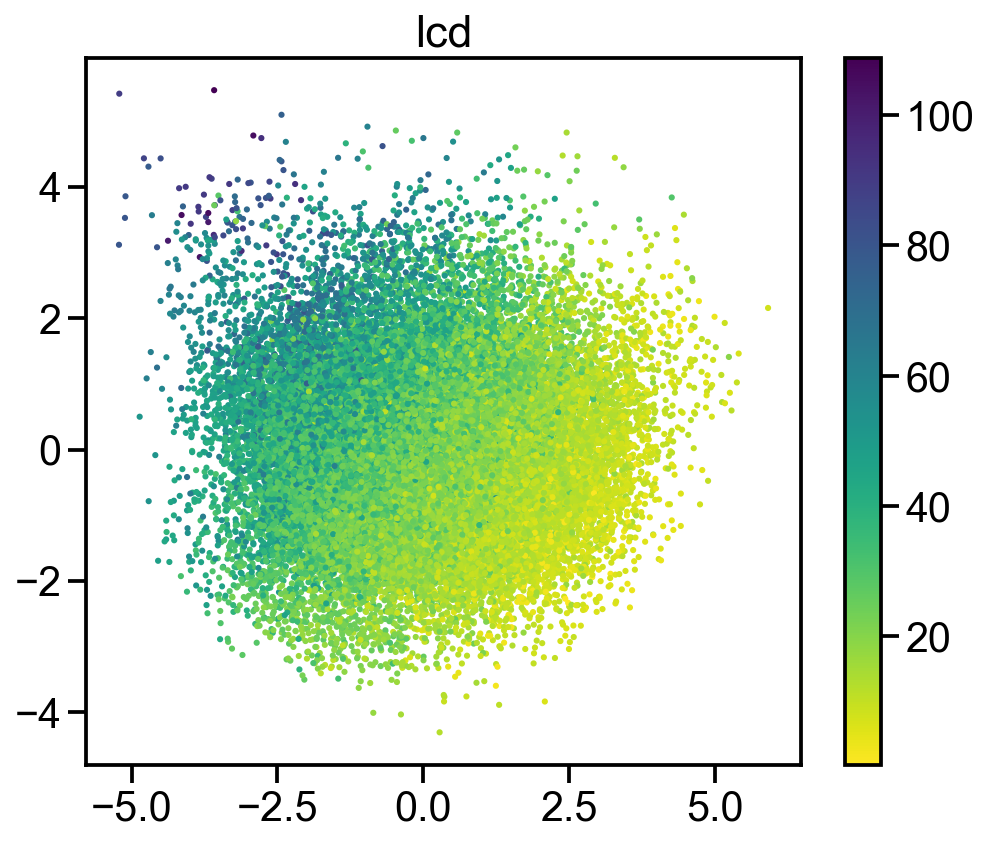

===================================== pld ======================================


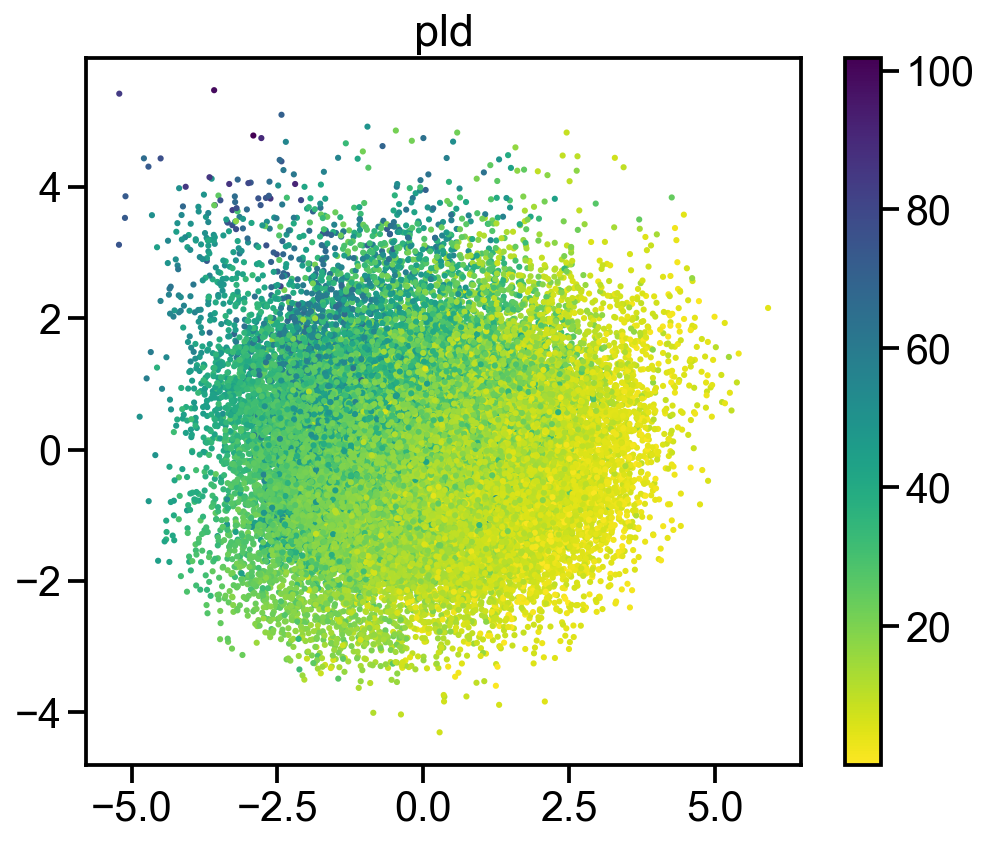

=================================== density ====================================


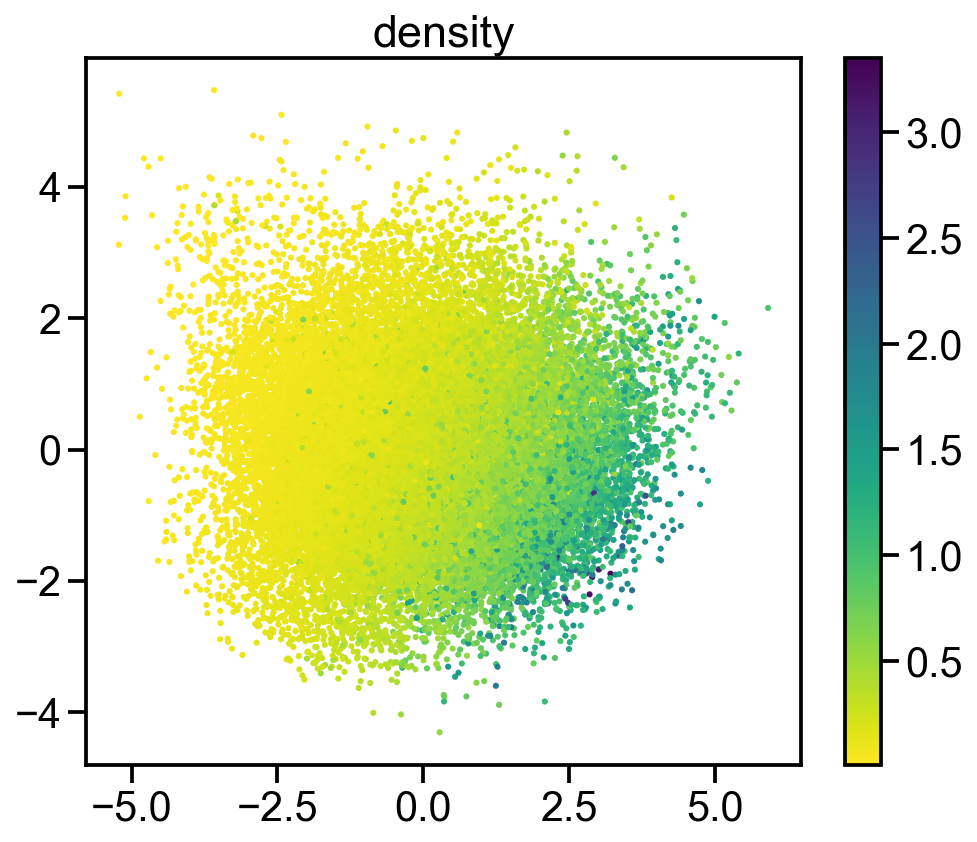

===================================== avf ======================================


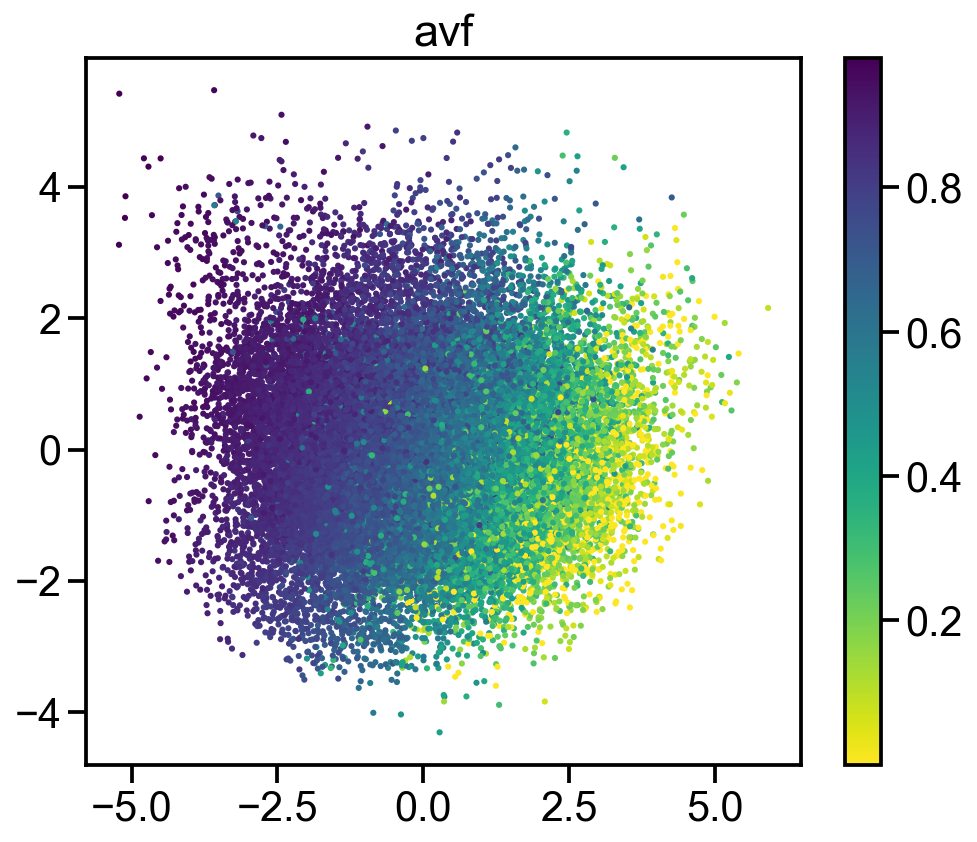

===================================== avsa =====================================


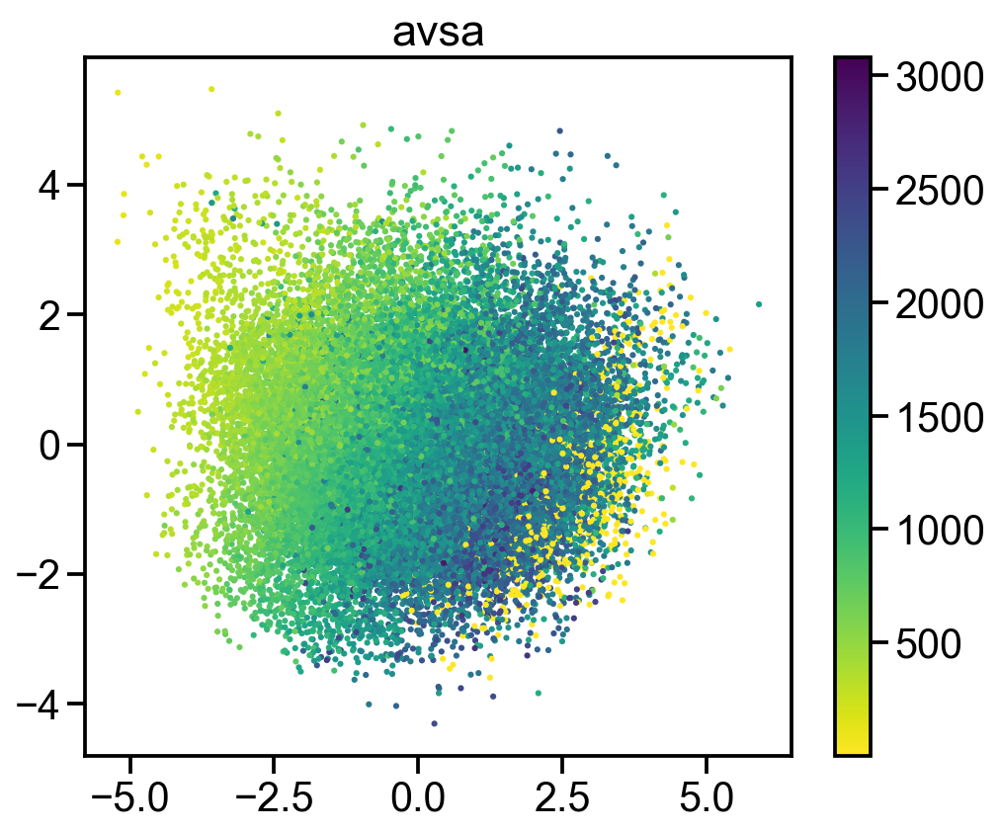

===================================== agsa =====================================


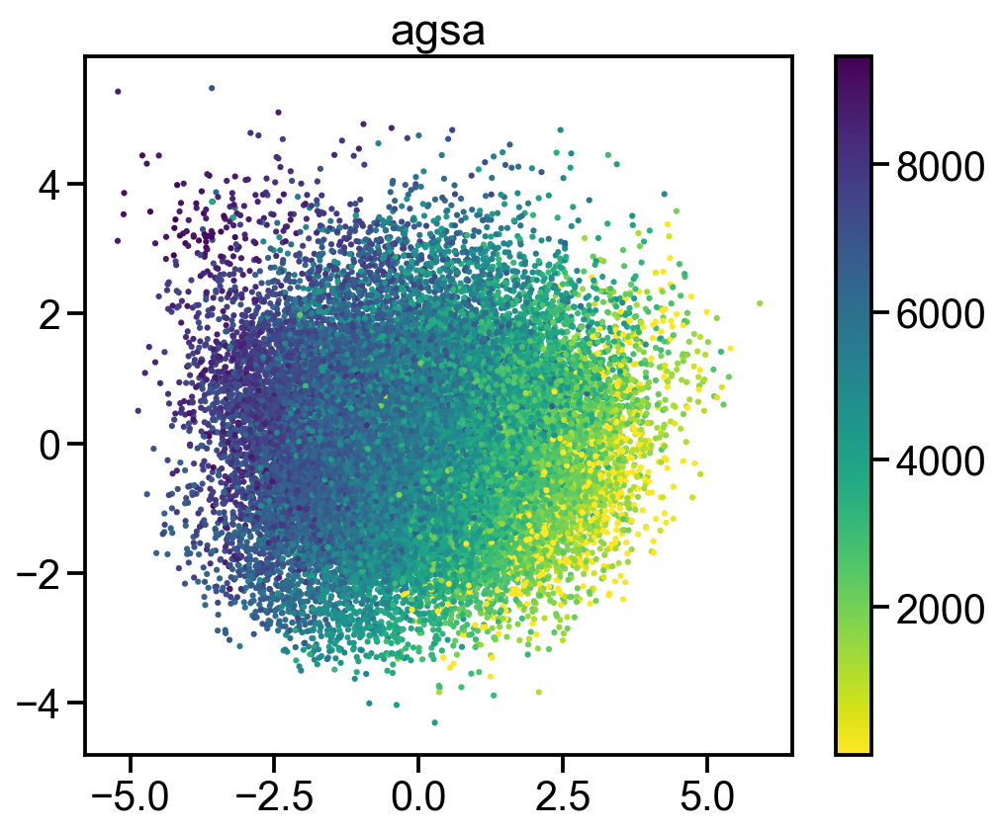

=============================== co2n2_co2_mol_kg ===============================


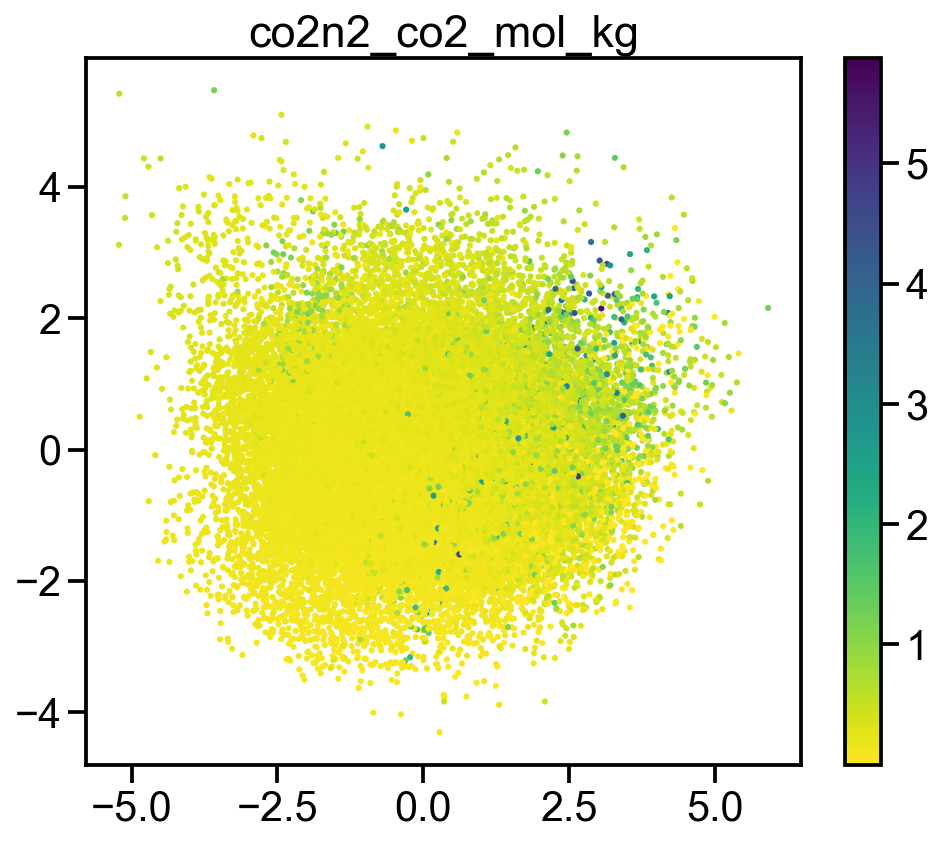

=============================== co2n2_n2_mol_kg ================================


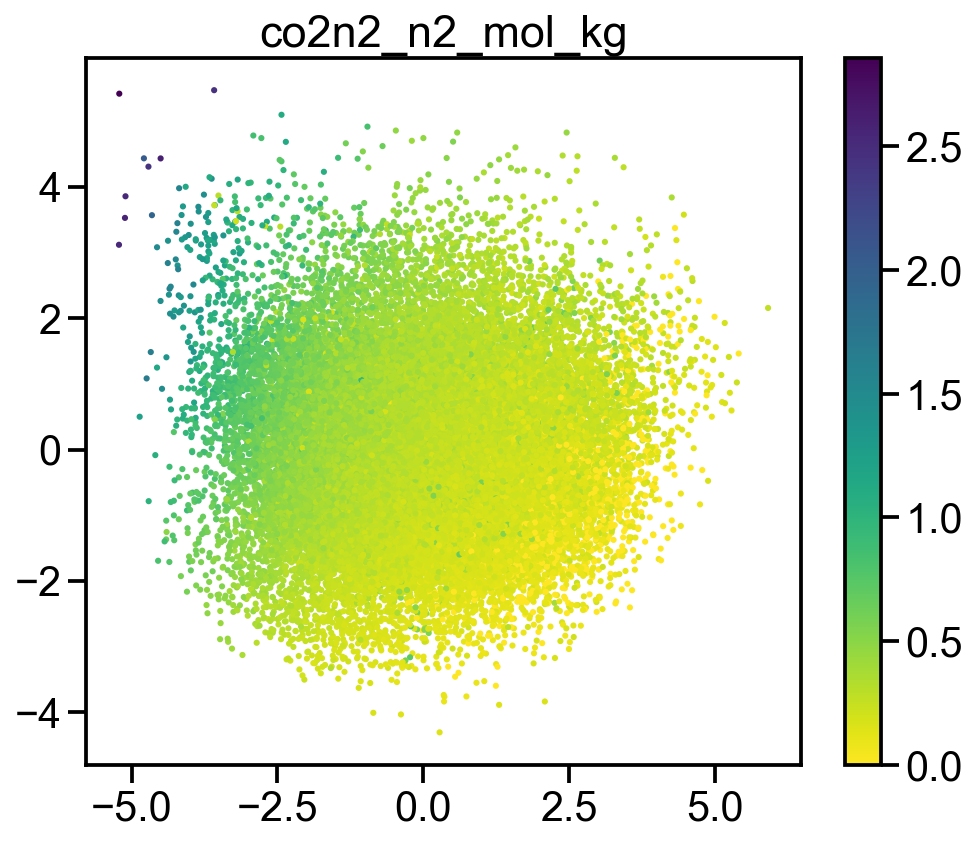

============================== co2n2_selectivity ===============================


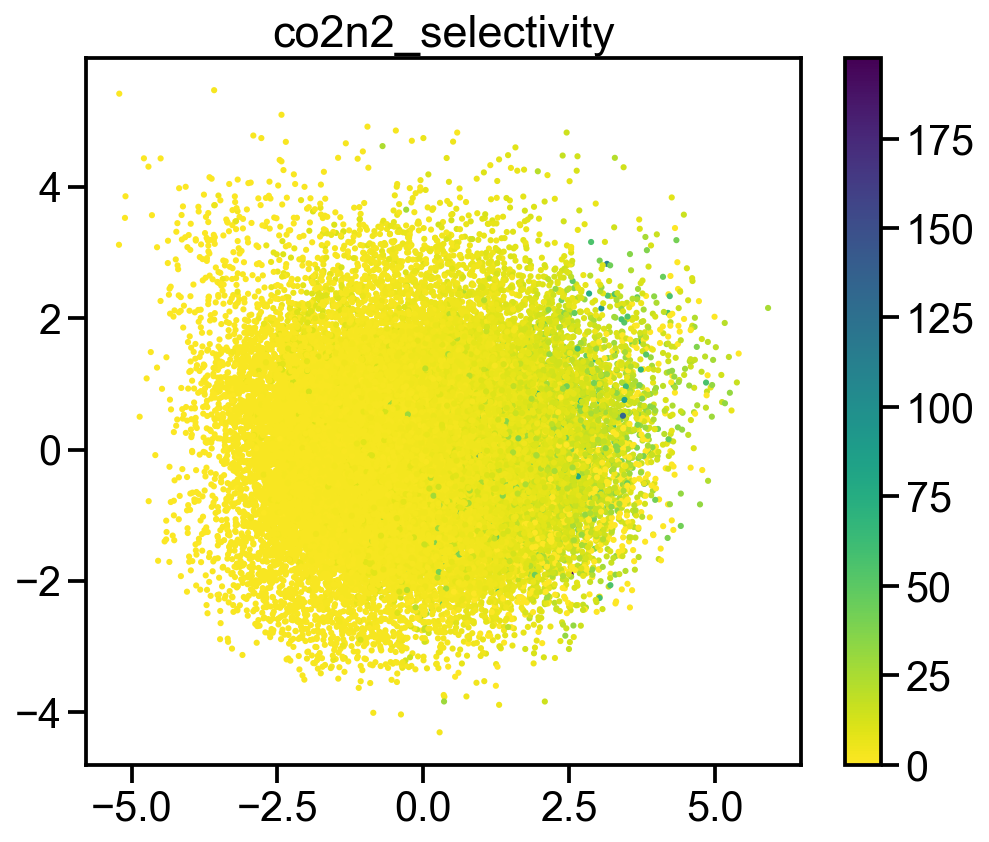

================================ co2n2_heat_avg ================================


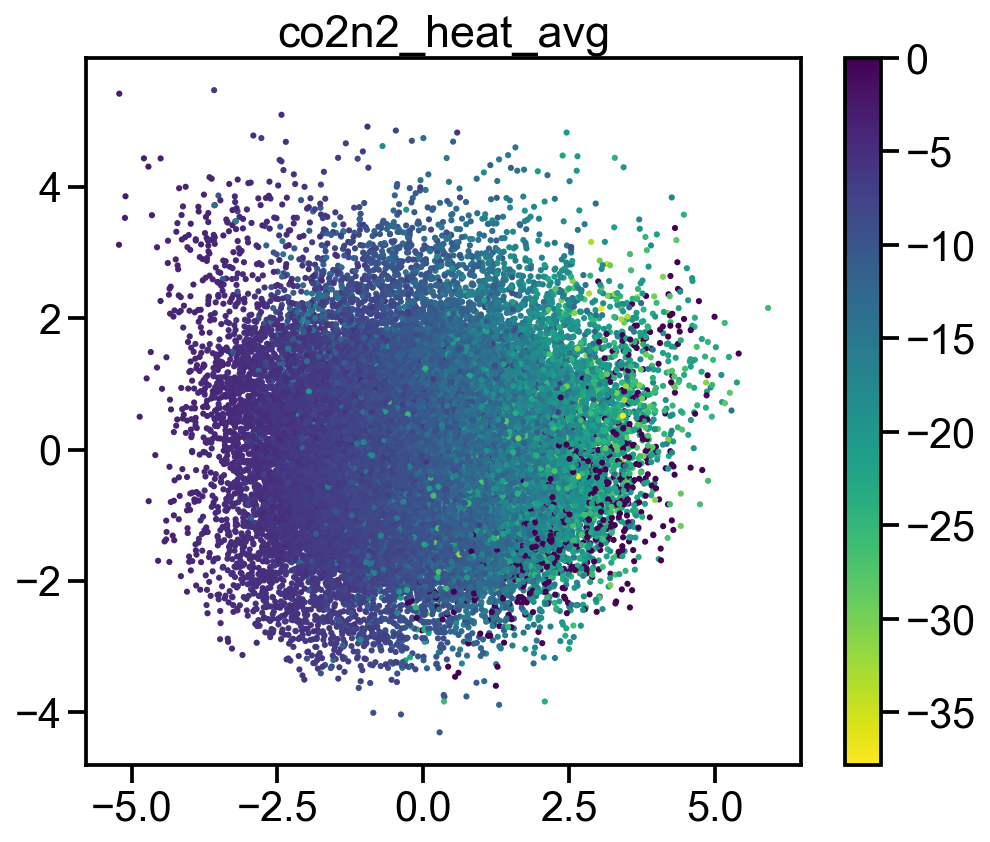

================================ co2n2_heat_co2 ================================


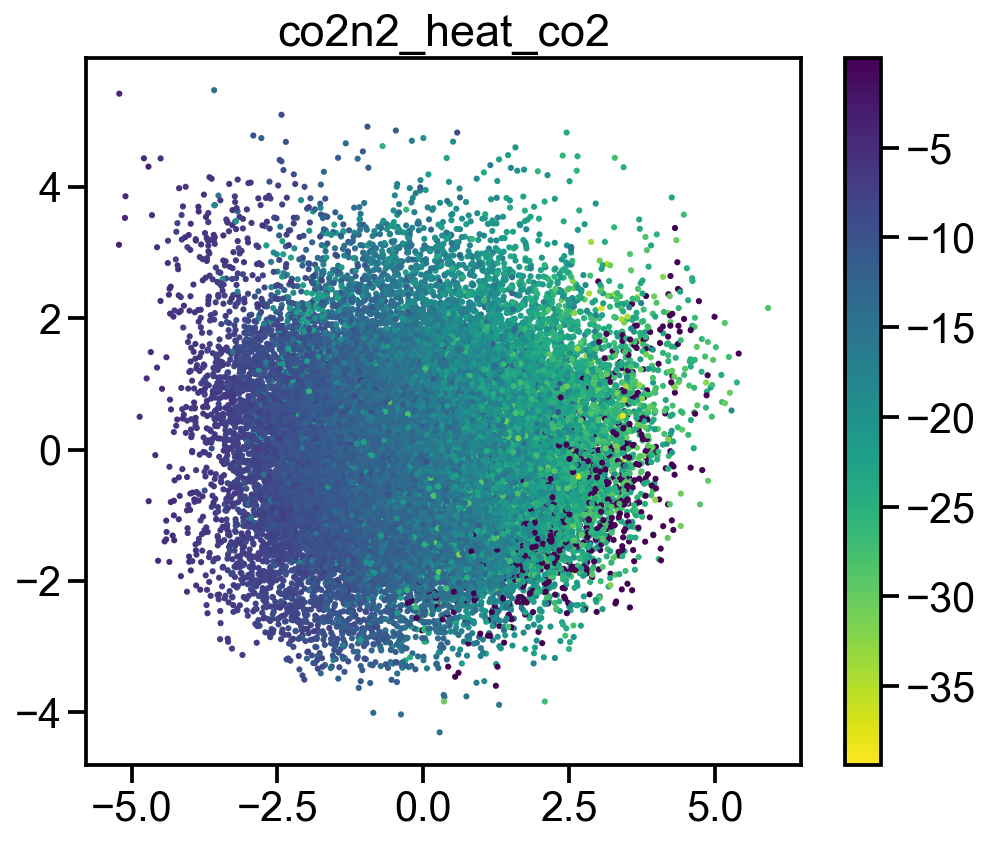

================================ co2n2_heat_n2 =================================


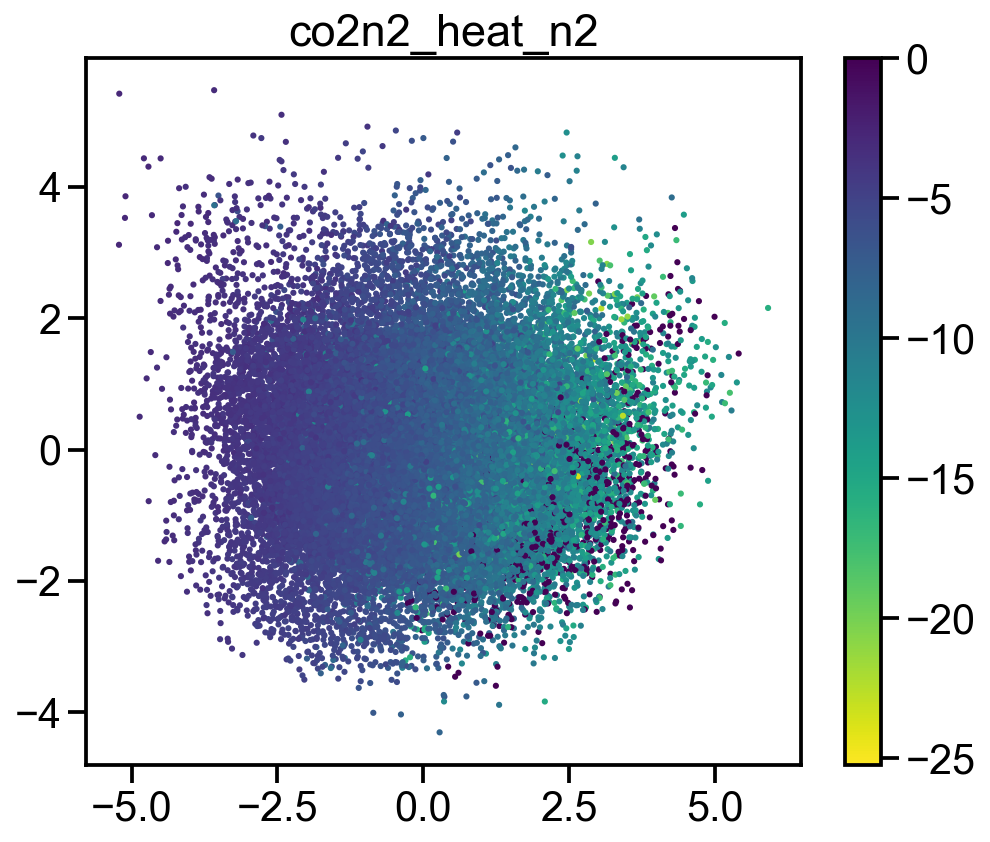

============================== co2n2_heat_molfrac ==============================


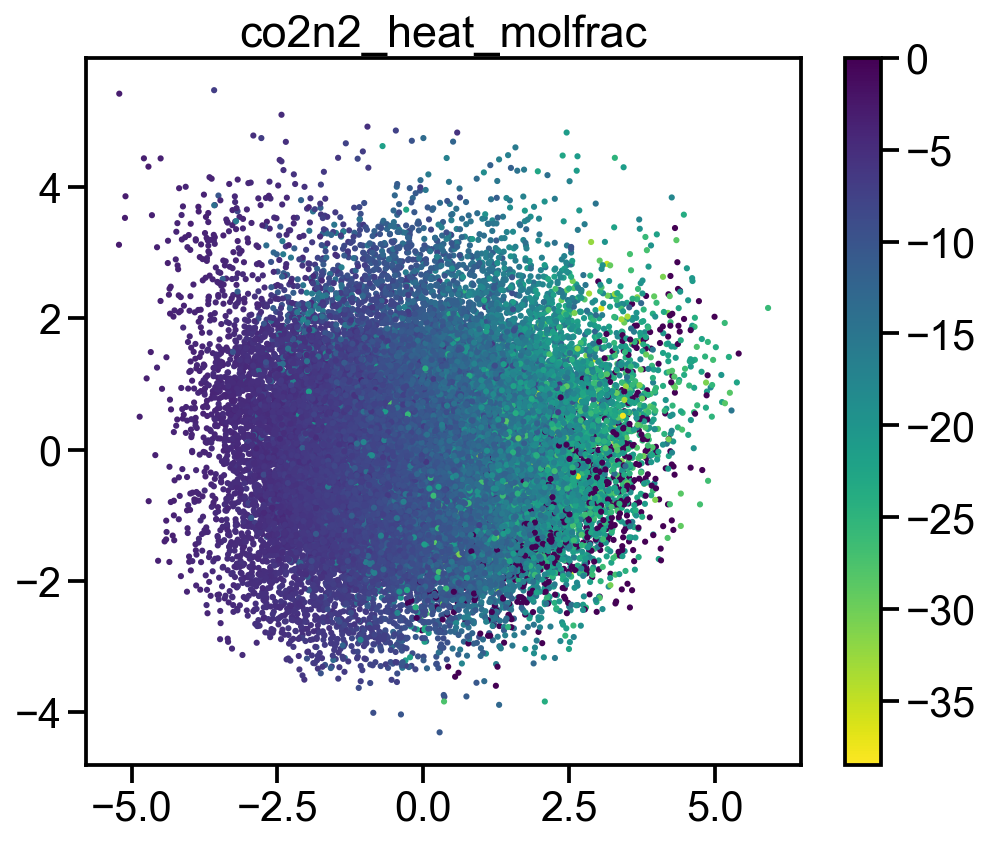

============================== co2ch4_co2_mol_kg ===============================


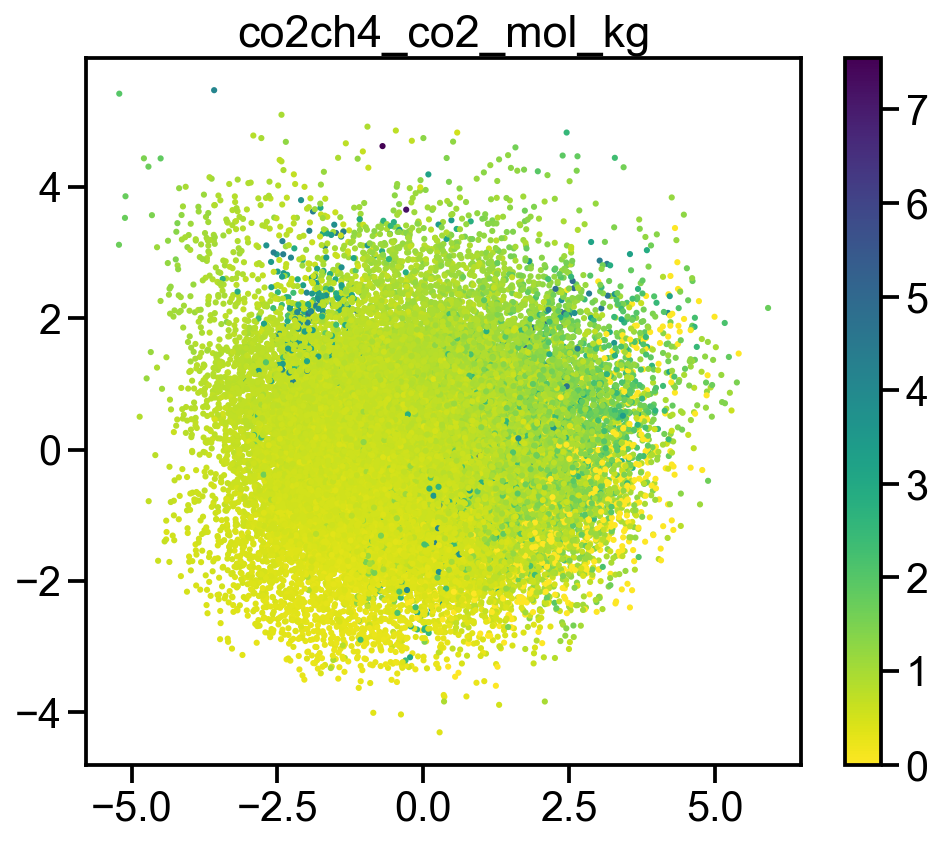

============================== co2ch4_ch4_mol_kg ===============================


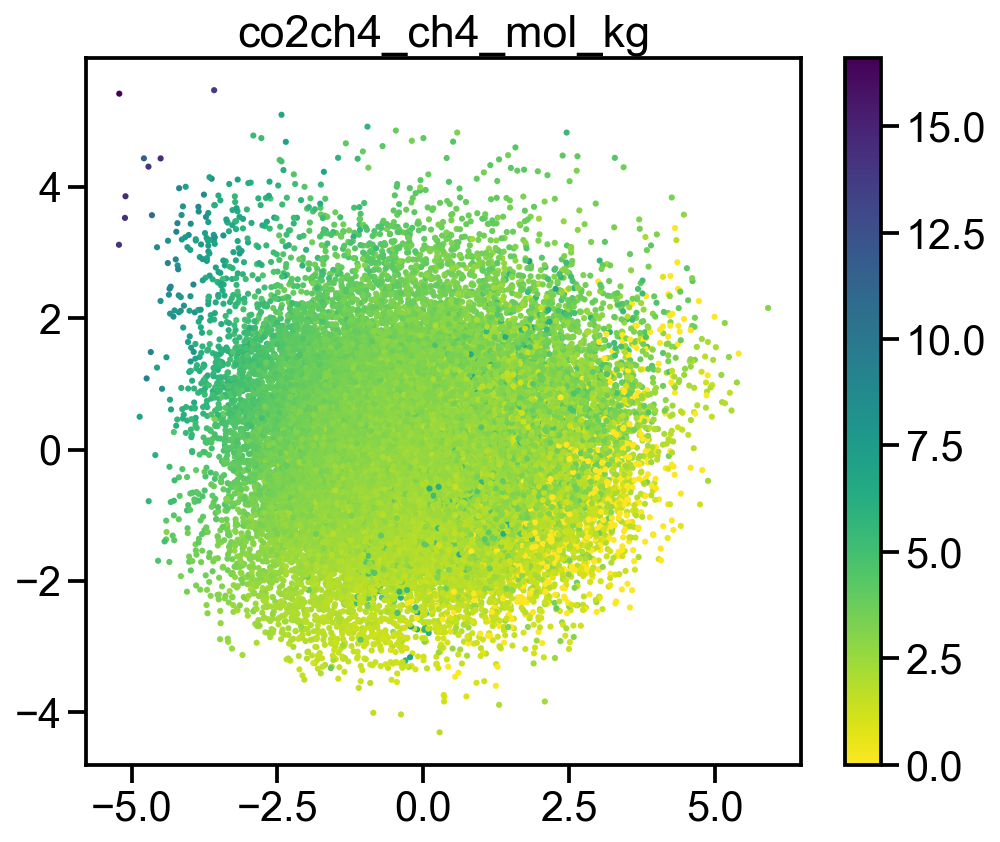

============================== co2ch4_selectivity ==============================


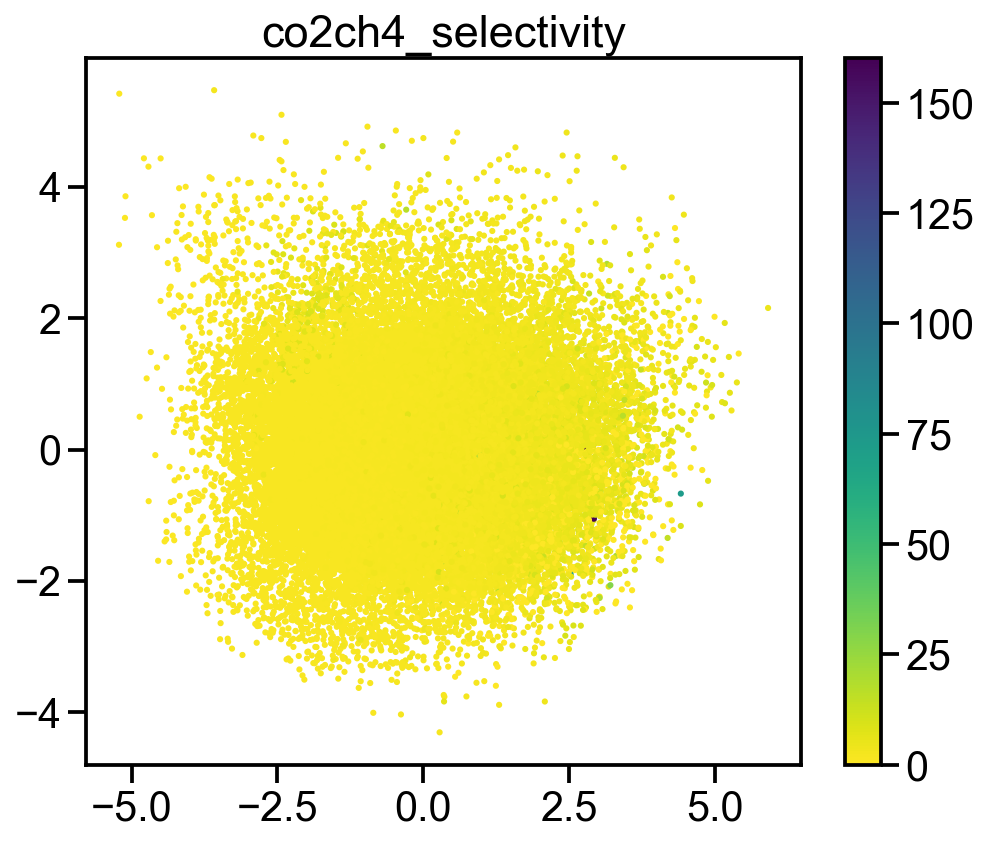

=============================== co2ch4_heat_avg ================================


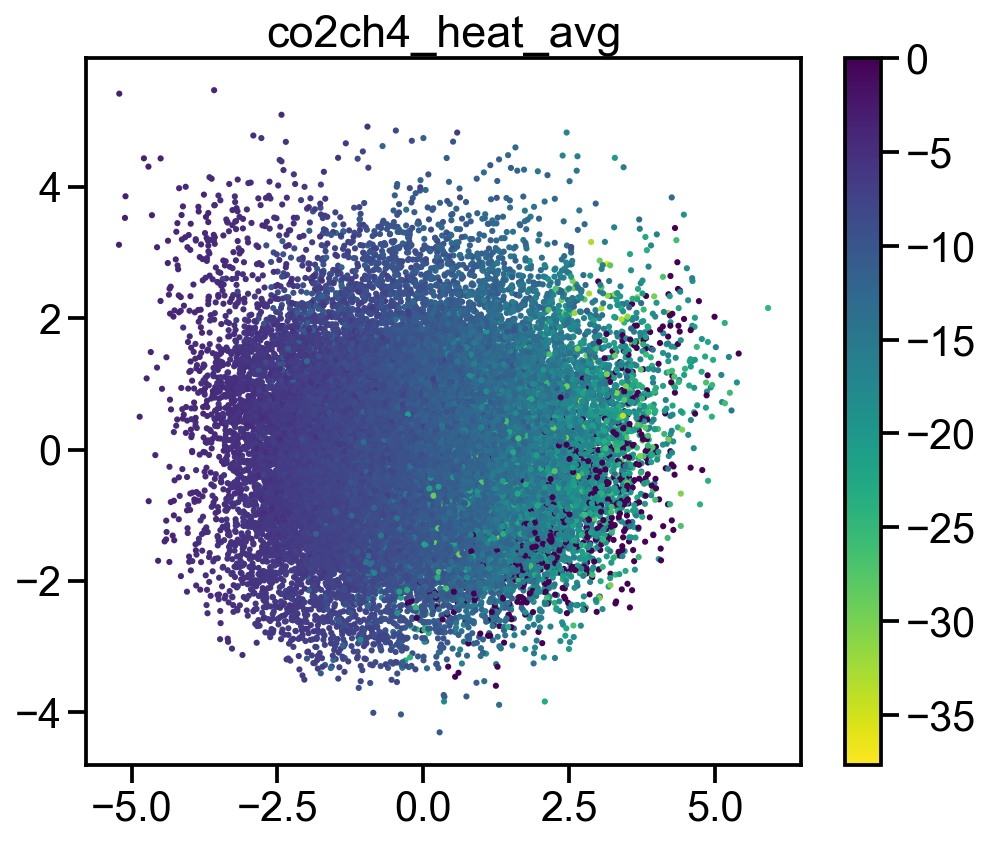

=============================== co2ch4_heat_co2 ================================


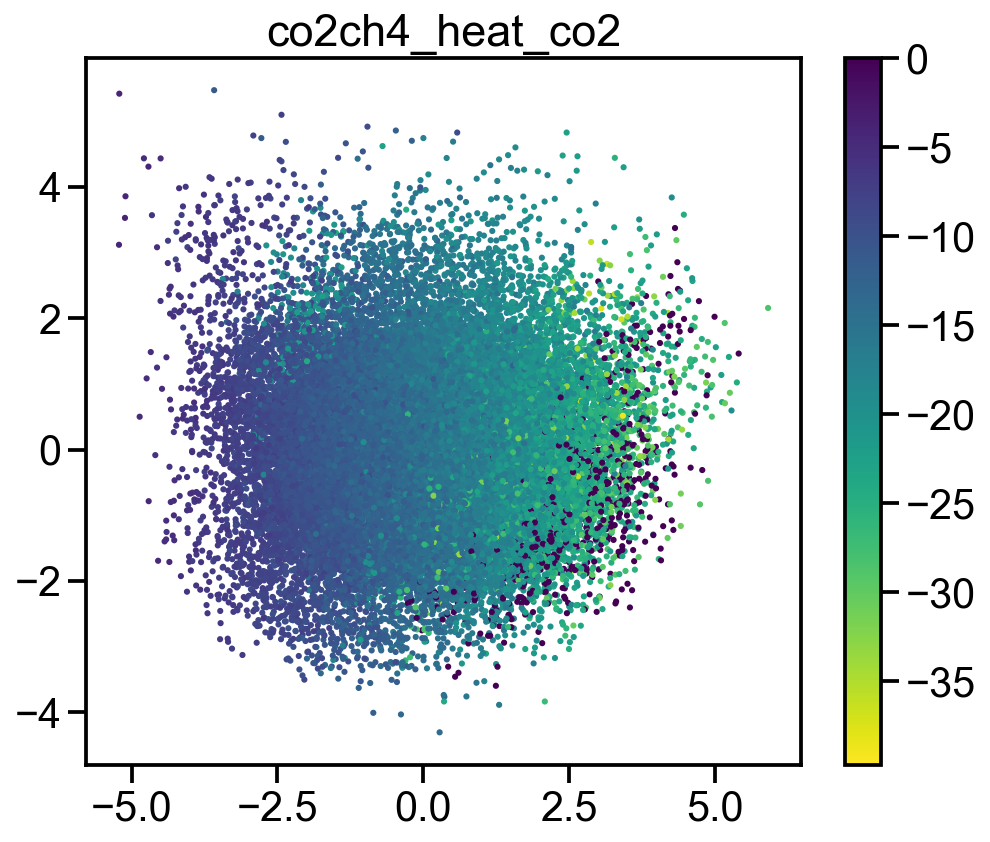

=============================== co2ch4_heat_ch4 ================================


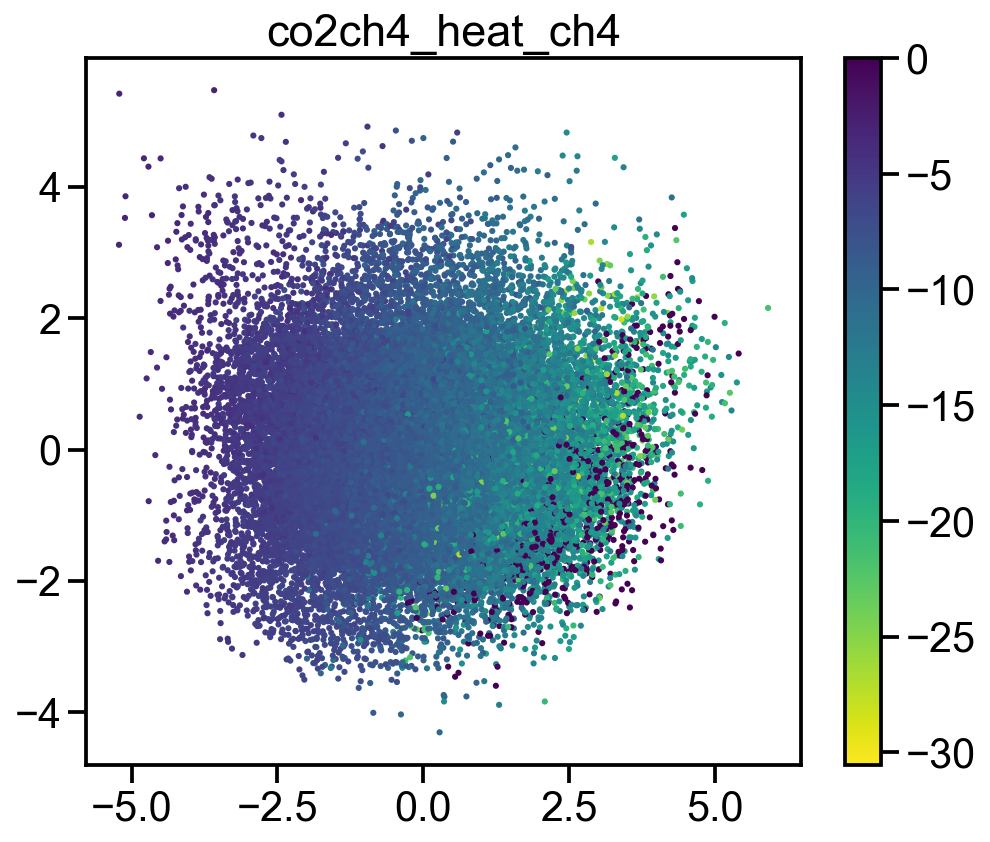

============================= co2ch4_heat_molfrac ==============================


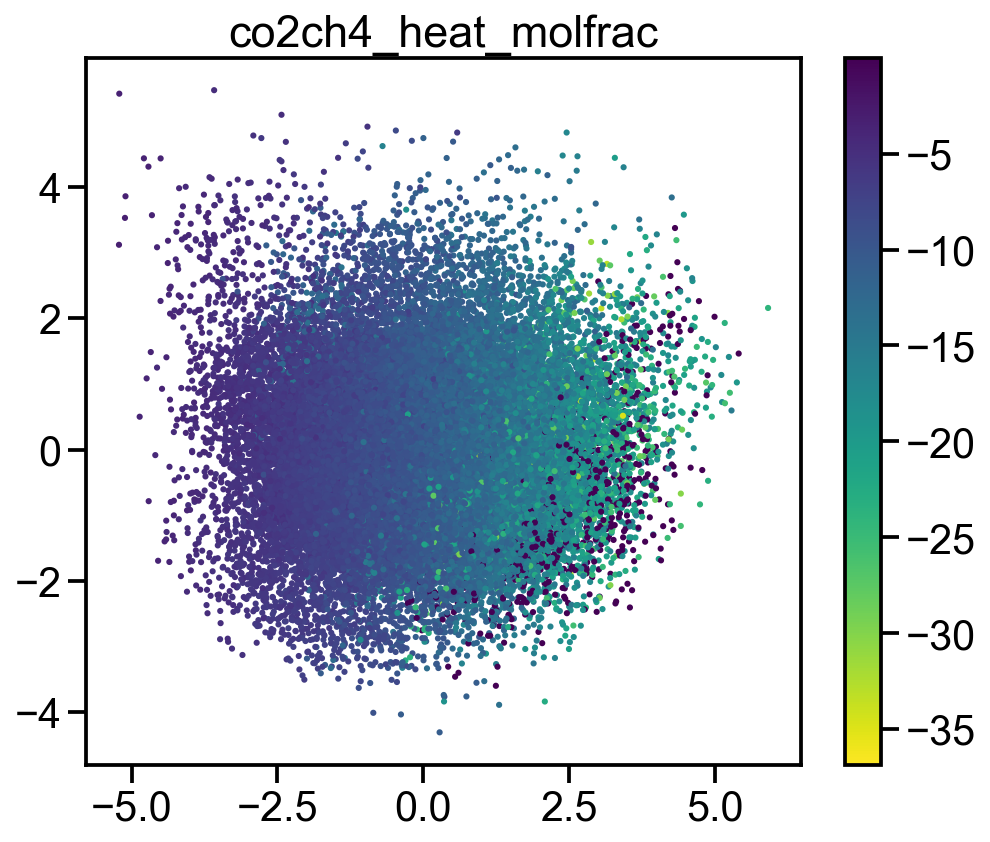

=================================== scscore ====================================


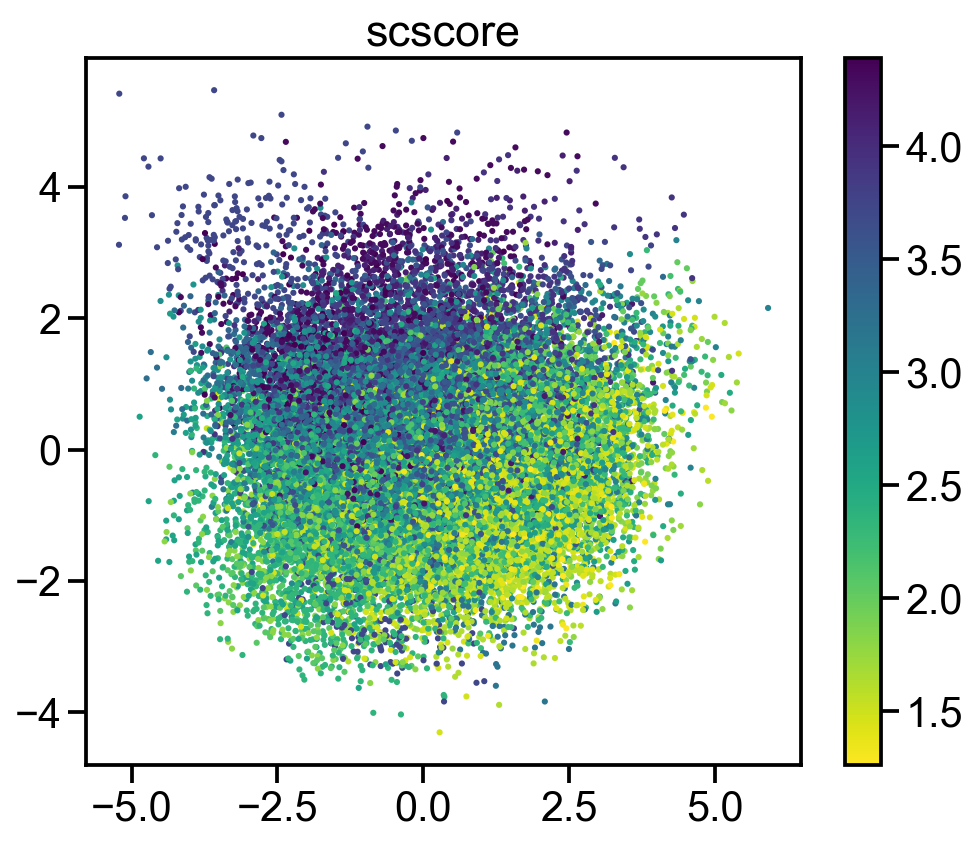

In [230]:
cmap='viridis_r'
for index,col in enumerate(hparams.y_labels):
    print(header_str(col))
    plt.figure(figsize=(8,6.5))
    scatter = plt.scatter(z_y_df['x'],z_y_df['y'],c=z_y_df[col], s=2.5,lw=1.5,cmap=cmap,edgecolor=None)
    plt.colorbar(scatter)
    #plt.legend(bbox_to_anchor=(1.5, .5))
    plt.title(col)
    plt.savefig('images/%s-%s.png'%(col,cmap),dpi=300,transparent=True)
    plt.show()